# Projeto: Indicadores de Mortalidade Materna e Atenção Obstétrica nas Regionais de Saúde do Paraná

Este notebook lê os arquivos do DATASUS e agrega os dados por **Regional de Saúde** e **ano**.


In [ ]:
# instalar dependências
#!pip install dbfread
#!pip install geopandas

In [ ]:
from pathlib import Path
import pandas as pd
from dbfread import DBF
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib as mpl
import unicodedata

In [ ]:
def normalize_datasus_date_ddmmyyyy(df, date_col: str,
                                   new_date_col: str | None = None,
                                   new_year_col: str | None = None) -> pd.DataFrame:
    """
    Normaliza datas do DATASUS no formato DDMMYYYY (8 dígitos).
    - Remove lixo (ex.: '23032021.0') extraindo exatamente 8 dígitos.
    - Retorna colunas *_DT (datetime) e *_ANO (Int64).
    """
    if new_date_col is None:
        new_date_col = f"{date_col}_DT"
    if new_year_col is None:
        new_year_col = f"{date_col}_ANO"

    df = df.copy()
    s = (
        df[date_col].astype(str).str.strip()
        .str.extract(r"(\d{8})", expand=False)
    )
    df[new_date_col] = pd.to_datetime(s, format="%d%m%Y", errors="coerce")
    df[new_year_col] = df[new_date_col].dt.year.astype("Int64")
    return df


In [ ]:
# ajuste de caminhos

IN_COLAB = False
try:
    from google.colab import drive
    IN_COLAB = True
except Exception:
    IN_COLAB = False

if IN_COLAB:
    drive.mount('/content/drive')
    DATA_DIR = Path('/content/drive/MyDrive/Projeto MM/data')
else:
    DATA_DIR = Path(r'C:\Users\Avell\Desktop\Projeto\data')

DBF_DIR_SIM = DATA_DIR / 'raw' / 'SIM'
CSV_DIR_SIH = DATA_DIR / 'raw' / 'SIH'
DIR_IBGE = DATA_DIR / 'raw' / 'IBGE'
AUX_DIR = DATA_DIR / 'auxiliary'
OUT_DIR = DATA_DIR / 'processed'
GEO_DIR = DATA_DIR / 'geo'
OUT_DIR.mkdir(parents=True, exist_ok=True)

MUN2RS_FILE = AUX_DIR / 'municipalities_health_regions_pr.xlsx'
RS_FILE = AUX_DIR / 'health_regions_pr.xlsx'

DBF_DIR_SIM, MUN2RS_FILE

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


(PosixPath('/content/drive/MyDrive/Projeto MM/data/raw/SIM'),
 PosixPath('/content/drive/MyDrive/Projeto MM/data/auxiliary/municipalities_health_regions_pr.xlsx'))

In [ ]:
# mapeamento Município -> Regional

mun2rs = pd.read_excel(MUN2RS_FILE)
mun2rs.columns = [c.strip() for c in mun2rs.columns]

rs = pd.read_excel(RS_FILE)
rs.columns = [c.strip() for c in rs.columns]

# padroniza código para string de 6 dígitos
def padroniza_municipio(df, col="Codigo", out_col="CODMUN_IBGE6"):
    s = df[col].astype(str).str.extract(r"(\d+)")[0]

    s = s.where(s.isna(), s.str.strip())
    s = s.where(s.isna(), s.str[:-1].where(s.str.len() == 7, s))

    df[out_col] = s.str.zfill(6)

    return df

mun2rs = padroniza_municipio(mun2rs)
mun2rs['REGIONAL_SAUDE'] = mun2rs['Regional de Saude'].astype(int)

mun2rs[['REGIONAL_SAUDE','Municipio','CODMUN_IBGE6']].head()

,REGIONAL_SAUDE,Municipio,CODMUN_IBGE6
0,18,Abatiá,410010
1,2,Adrianópolis,410020
2,2,Agudos do Sul,410030
3,2,Almirante Tamandaré,410040
4,11,Altamira do Paraná,410045


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# ler DBFs do SIM (DOMAT*)
dfs = []
for f in sorted(DBF_DIR_SIM.glob('DOMAT*.dbf')):
    df = pd.DataFrame(iter(DBF(f, load=True, char_decode_errors='ignore')))
    df.columns = [c.strip().upper() for c in df.columns]
    df['ARQUIVO_ORIGEM'] = f.name
    dfs.append(df)

if not dfs:
    raise FileNotFoundError(f'Nenhum DOMAT*.dbf encontrado em: {DBF_DIR_SIM}')

sim = pd.concat(dfs, ignore_index=True)
(sim.shape, list(sim.columns)[:25])

((7051, 88),
 ['ORIGEM',
  'TIPOBITO',
  'DTOBITO',
  'HORAOBITO',
  'NATURAL',
  'CODMUNNATU',
  'DTNASC',
  'IDADE',
  'SEXO',
  'RACACOR',
  'ESTCIV',
  'ESC',
  'ESC2010',
  'SERIESCFAL',
  'OCUP',
  'CODMUNRES',
  'LOCOCOR',
  'CODESTAB',
  'ESTABDESCR',
  'CODMUNOCOR',
  'IDADEMAE',
  'ESCMAE',
  'ESCMAE2010',
  'SERIESCMAE',
  'OCUPMAE'])

In [ ]:
# normalizar datas (DTOBITO)
sim = normalize_datasus_date_ddmmyyyy(sim, 'DTOBITO')

# identificar coluna do município de residência
mun_col = None
for cand in ['CODMUNRES', 'MUNRES', 'MUN_RES', 'MUNIC_RES']:
    if cand in sim.columns:
        mun_col = cand
        break
if mun_col is None:
    raise ValueError('Não achei coluna de município de residência (CODMUNRES/MUNRES/...).')

# padroniza IBGE com 6 dígitos
sim['CODMUNRES_PAD'] = (
    sim[mun_col].astype(str)
    .str.extract(r'(\d+)', expand=False)
    .fillna('')
    .str.zfill(6)
)

# checagens rápidas
print('Anos (DTOBITO_ANO) - top:', sim['DTOBITO_ANO'].value_counts(dropna=False).head(10).to_dict())
print('Municípios (top):', sim['CODMUNRES_PAD'].value_counts().head(10).to_dict())


Anos (DTOBITO_ANO) - top: {np.int64(2021): 3030, np.int64(2022): 1370, np.int64(2024): 1326, np.int64(2023): 1325}
Municípios (top): {'330455': 229, '355030': 206, '130260': 130, '292740': 89, '530010': 77, '520870': 68, '330170': 62, '140010': 57, '351880': 54, '230440': 51}


In [ ]:
# integrar Regional de Saúde
# fazer join pelo código IBGE
sim = sim.merge(
    mun2rs[['CODMUN_IBGE6','REGIONAL_SAUDE', 'Municipio']],
    how='left',
    left_on='CODMUNRES_PAD',
    right_on='CODMUN_IBGE6'
)

sim["REGIONAL_SAUDE"] = sim["REGIONAL_SAUDE"].astype("Int64")

# quantos ficaram sem regional? (deve ser 0)
sim_pr = sim[sim["CODMUNRES_PAD"].str.startswith("41")].copy()
missing = sim_pr["REGIONAL_SAUDE"].isna().mean()
print(f"% sem REGIONAL_SAUDE (após filtro PR): {missing:.2%}")

# se houver faltantes, mostrar exemplos
if missing > 0:
    display(sim.loc[sim['REGIONAL_SAUDE'].isna(), ['CODMUNRES_PAD', mun_col]].head(20))


% sem REGIONAL_SAUDE (após filtro PR): 0.00%


In [ ]:
sim_pr

,ORIGEM,TIPOBITO,DTOBITO,HORAOBITO,NATURAL,CODMUNNATU,DTNASC,IDADE,SEXO,RACACOR,...,FONTESINF,ALTCAUSA,CONTADOR,ARQUIVO_ORIGEM,DTOBITO_DT,DTOBITO_ANO,CODMUNRES_PAD,CODMUN_IBGE6,REGIONAL_SAUDE,Municipio
37,1,2,27012021,1005,841,411990,01121988,432,2,1,...,,,30333,DOMAT21.dbf,2021-01-27,2021,411990,411990,3,Ponta Grossa
92,1,2,05062021,2100,841,410690,28021984,437,2,1,...,,,53484,DOMAT21.dbf,2021-06-05,2021,410690,410690,2,Curitiba
96,1,2,05062021,1550,800,,26091986,434,2,1,...,,,54741,DOMAT21.dbf,2021-06-05,2021,410100,410100,8,Ampére
102,1,2,28032021,0640,841,411200,04101993,427,2,1,...,,,58371,DOMAT21.dbf,2021-03-28,2021,411200,411200,3,Jaguariaíva
130,1,2,05062021,1336,841,411610,10111989,431,2,1,...,,,72616,DOMAT21.dbf,2021-06-05,2021,412790,412790,13,Tuneiras Do Oeste
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6960,1,2,05122024,1749,841,412370,05011996,428,2,1,...,,,1424078,DOMAT24.dbf,2024-12-05,2024,412395,412395,14,Santa Mônica
6978,1,2,10122024,0820,817,170210,17111988,436,2,4,...,,,1446000,DOMAT24.dbf,2024-12-10,2024,410100,410100,8,Ampére
7008,1,2,20122024,0550,841,411850,02041996,428,2,1,...,,,1484028,DOMAT24.dbf,2024-12-20,2024,411850,411850,7,Pato Branco
7037,1,2,28122024,1424,841,410200,26122004,420,2,4,...,,,1517109,DOMAT24.dbf,2024-12-28,2024,410830,410830,9,Foz do Iguaçu


In [ ]:
# filtrar período e agregar por ano e Regional
ANOS = (2021, 2024)

sim_filt = sim[
    sim['DTOBITO_ANO'].between(ANOS[0], ANOS[1]) &
    sim['REGIONAL_SAUDE'].notna()
].copy()

sim_rs = (
    sim_filt
    .groupby(['REGIONAL_SAUDE','DTOBITO_ANO'])
    .size()
    .reset_index(name='OBITOS_MATERNOS')
    .sort_values(['REGIONAL_SAUDE','DTOBITO_ANO'])
)

sim_rs

,REGIONAL_SAUDE,DTOBITO_ANO,OBITOS_MATERNOS
0,1,2021,12
1,1,2022,3
2,1,2023,2
3,1,2024,4
4,2,2021,45
...,...,...,...
73,21,2022,2
74,21,2023,2
75,22,2021,2
76,22,2022,2


In [ ]:
# filtrar período e agregar por Regional
ANOS = (2021, 2024)

sim_filt2 = sim[
    sim['DTOBITO_ANO'].between(ANOS[0], ANOS[1]) &
    sim['REGIONAL_SAUDE'].notna()
].copy()

sim_rs2 = (
    sim_filt2
    .groupby(['REGIONAL_SAUDE'])
    .size()
    .reset_index(name='OBITOS_MATERNOS')
    .sort_values(['REGIONAL_SAUDE'])
)

sim_rs2

,REGIONAL_SAUDE,OBITOS_MATERNOS
0,1,21
1,2,93
2,3,26
3,4,10
4,5,21
5,6,2
6,7,10
7,8,9
8,9,12
9,10,13


In [ ]:
# filtrar período e agregar por Regional e Município
ANOS = (2021, 2024)

sim_filt3 = sim[
    sim['DTOBITO_ANO'].between(ANOS[0], ANOS[1]) &
    sim['REGIONAL_SAUDE'].notna()
].copy()

sim_rs_mun_incompleto = (
    sim_filt3
    .groupby(['REGIONAL_SAUDE', 'Municipio', 'CODMUNRES_PAD'])
    .size()
    .reset_index(name='OBITOS_MATERNOS')
    .sort_values(['REGIONAL_SAUDE', 'Municipio'])
)

sim_rs_mun = mun2rs.copy()

sim_rs_mun = sim_rs_mun.merge(
    sim_rs_mun_incompleto[['CODMUNRES_PAD','REGIONAL_SAUDE', 'Municipio', 'OBITOS_MATERNOS']],
    how='left',
    left_on='CODMUN_IBGE6',
    right_on='CODMUNRES_PAD'
)

sim_rs_mun = sim_rs_mun.drop(columns=['CODMUN_IBGE6', 'REGIONAL_SAUDE_x', 'CODMUNRES_PAD', 'REGIONAL_SAUDE_y', 'Municipio_y'])
sim_rs_mun.rename(columns={'Municipio_x': 'Municipio'}, inplace=True)
sim_rs_mun['OBITOS_MATERNOS'] = sim_rs_mun['OBITOS_MATERNOS'].fillna(0)
sim_rs_mun['OBITOS_MATERNOS'] = sim_rs_mun['OBITOS_MATERNOS'].astype(int)

# Dataframe a ser exportado como sim
sim_rs_mun

,Regional de Saude,Municipio,Codigo,OBITOS_MATERNOS
0,18,Abatiá,410010,1
1,2,Adrianópolis,410020,0
2,2,Agudos do Sul,410030,0
3,2,Almirante Tamandaré,410040,4
4,11,Altamira do Paraná,410045,0
...,...,...,...,...
394,8,Verê,412860,0
395,5,Virmond,412865,0
396,7,Vitorino,412870,0
397,19,Wenceslau Braz,412850,2


In [ ]:
# carregar o shapefile
df_mapa = gpd.read_file(GEO_DIR / 'Limites_Municipais_2020.shp')

In [ ]:
# verificar o dataframe
df_mapa

,gid,codibge,nome,geometry
0,399,4128807,Xambre,"POLYGON ((-53.53611 -23.81954, -53.5366 -23.81..."
1,93,4106852,Cruzmaltina,"POLYGON ((-51.38116 -24.05889, -51.38115 -24.0..."
2,348,4125407,Sao Jose Da Boa Vista,"POLYGON ((-49.53659 -23.92793, -49.53674 -23.9..."
3,331,4124004,Santana Do Itarare,"POLYGON ((-49.6312 -23.84646, -49.63154 -23.84..."
4,359,4126207,Sapopema,"POLYGON ((-50.44879 -23.75585, -50.44878 -23.7..."
...,...,...,...,...
394,238,4117214,Nova Santa Barbara,"POLYGON ((-50.77044 -23.61442, -50.77055 -23.6..."
395,296,4121307,Rancho Alegre,"POLYGON ((-50.85481 -23.1117, -50.85514 -23.11..."
396,364,4126405,Sertaneja,"POLYGON ((-50.84225 -23.11003, -50.84237 -23.1..."
397,141,4109807,Ibipora,"POLYGON ((-50.94779 -23.10645, -50.94751 -23.1..."


In [ ]:
df_mapa["CODMUN_IBGE6"] = (
    df_mapa["codibge"]
    .astype(str)
    .str.slice(0, 6)
)
df_mapa

,gid,codibge,nome,geometry,CODMUN_IBGE6
0,399,4128807,Xambre,"POLYGON ((-53.53611 -23.81954, -53.5366 -23.81...",412880
1,93,4106852,Cruzmaltina,"POLYGON ((-51.38116 -24.05889, -51.38115 -24.0...",410685
2,348,4125407,Sao Jose Da Boa Vista,"POLYGON ((-49.53659 -23.92793, -49.53674 -23.9...",412540
3,331,4124004,Santana Do Itarare,"POLYGON ((-49.6312 -23.84646, -49.63154 -23.84...",412400
4,359,4126207,Sapopema,"POLYGON ((-50.44879 -23.75585, -50.44878 -23.7...",412620
...,...,...,...,...,...
394,238,4117214,Nova Santa Barbara,"POLYGON ((-50.77044 -23.61442, -50.77055 -23.6...",411721
395,296,4121307,Rancho Alegre,"POLYGON ((-50.85481 -23.1117, -50.85514 -23.11...",412130
396,364,4126405,Sertaneja,"POLYGON ((-50.84225 -23.11003, -50.84237 -23.1...",412640
397,141,4109807,Ibipora,"POLYGON ((-50.94779 -23.10645, -50.94751 -23.1...",410980


In [ ]:
df_mapa1 = df_mapa.merge(
    mun2rs[["CODMUN_IBGE6", "REGIONAL_SAUDE"]],
    how="left",
    on="CODMUN_IBGE6"
)
df_mapa1

,gid,codibge,nome,geometry,CODMUN_IBGE6,REGIONAL_SAUDE
0,399,4128807,Xambre,"POLYGON ((-53.53611 -23.81954, -53.5366 -23.81...",412880,12
1,93,4106852,Cruzmaltina,"POLYGON ((-51.38116 -24.05889, -51.38115 -24.0...",410685,22
2,348,4125407,Sao Jose Da Boa Vista,"POLYGON ((-49.53659 -23.92793, -49.53674 -23.9...",412540,19
3,331,4124004,Santana Do Itarare,"POLYGON ((-49.6312 -23.84646, -49.63154 -23.84...",412400,19
4,359,4126207,Sapopema,"POLYGON ((-50.44879 -23.75585, -50.44878 -23.7...",412620,18
...,...,...,...,...,...,...
394,238,4117214,Nova Santa Barbara,"POLYGON ((-50.77044 -23.61442, -50.77055 -23.6...",411721,18
395,296,4121307,Rancho Alegre,"POLYGON ((-50.85481 -23.1117, -50.85514 -23.11...",412130,18
396,364,4126405,Sertaneja,"POLYGON ((-50.84225 -23.11003, -50.84237 -23.1...",412640,18
397,141,4109807,Ibipora,"POLYGON ((-50.94779 -23.10645, -50.94751 -23.1...",410980,17


In [ ]:
df_mapa1["REGIONAL_SAUDE"].isna().sum()

np.int64(0)

In [ ]:
df_mapa_rs1 = (
    df_mapa1
    .dissolve(
        by="REGIONAL_SAUDE",
        as_index=False
    )
)
df_mapa_rs1

,REGIONAL_SAUDE,geometry,gid,codibge,nome,CODMUN_IBGE6
0,1,"POLYGON ((-48.98943 -25.90592, -48.98922 -25.9...",216,4115705,Matinhos,411570
1,2,"POLYGON ((-49.48664 -26.18714, -49.4867 -26.18...",382,4127882,Tunas Do Parana,412788
2,3,"POLYGON ((-50.09458 -25.6357, -50.09523 -25.63...",275,4119905,Ponta Grossa,411990
3,4,"POLYGON ((-50.67702 -25.87633, -50.6768 -25.87...",195,4113908,Mallet,411390
4,5,"POLYGON ((-52.12418 -25.77454, -52.1246 -25.77...",122,4108452,Foz Do Jordao,410845
5,6,"POLYGON ((-51.25503 -26.37317, -51.25389 -26.3...",35,4102901,Bituruna,410290
6,7,"POLYGON ((-52.52202 -26.3978, -52.52292 -26.39...",75,4105409,Chopinzinho,410540
7,8,"POLYGON ((-53.43224 -26.27987, -53.43309 -26.2...",283,4120358,Pranchita,412035
8,9,"POLYGON ((-53.91971 -25.57936, -53.92299 -25.5...",119,4108304,Foz Do Iguacu,410830
9,10,"POLYGON ((-53.48976 -25.53275, -53.49061 -25.5...",327,4123824,Santa Lucia,412382


<Axes: >

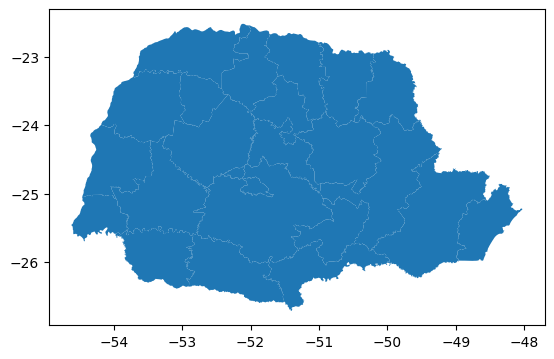

In [ ]:
# exibir o mapa
df_mapa_rs1.plot()

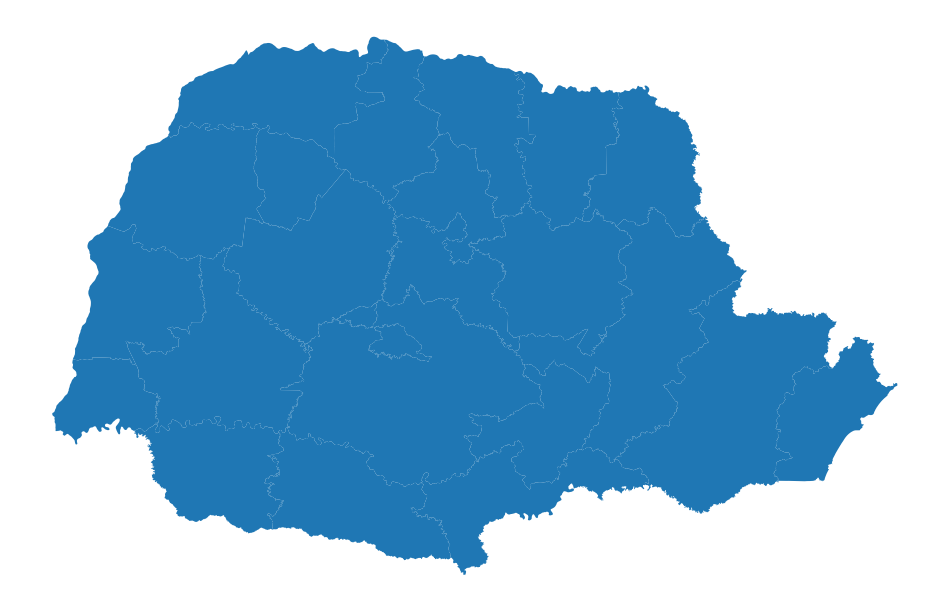

In [ ]:
# expandir o espaço do mapa
fig, ax = plt.subplots(1, figsize=(12,12))

# desenhar o mapa
df_mapa_rs1.plot(ax=ax)

# tirar os eixos
ax.set_axis_off()

plt.show()

In [ ]:
df_mapa_rs1 = df_mapa_rs1.merge(
    rs[["REGIONAL_SAUDE", "REGIONAL"]],
    how="left",
    on="REGIONAL_SAUDE"
)
df_mapa_rs1

,REGIONAL_SAUDE,geometry,gid,codibge,nome,CODMUN_IBGE6,REGIONAL
0,1,"POLYGON ((-48.98943 -25.90592, -48.98922 -25.9...",216,4115705,Matinhos,411570,Paranaguá
1,2,"POLYGON ((-49.48664 -26.18714, -49.4867 -26.18...",382,4127882,Tunas Do Parana,412788,Metropolitana
2,3,"POLYGON ((-50.09458 -25.6357, -50.09523 -25.63...",275,4119905,Ponta Grossa,411990,Ponta Grossa
3,4,"POLYGON ((-50.67702 -25.87633, -50.6768 -25.87...",195,4113908,Mallet,411390,Irati
4,5,"POLYGON ((-52.12418 -25.77454, -52.1246 -25.77...",122,4108452,Foz Do Jordao,410845,Guarapuava
5,6,"POLYGON ((-51.25503 -26.37317, -51.25389 -26.3...",35,4102901,Bituruna,410290,União da Vitória
6,7,"POLYGON ((-52.52202 -26.3978, -52.52292 -26.39...",75,4105409,Chopinzinho,410540,Pato Branco
7,8,"POLYGON ((-53.43224 -26.27987, -53.43309 -26.2...",283,4120358,Pranchita,412035,Francisco Beltrão
8,9,"POLYGON ((-53.91971 -25.57936, -53.92299 -25.5...",119,4108304,Foz Do Iguacu,410830,Foz do Iguaçu
9,10,"POLYGON ((-53.48976 -25.53275, -53.49061 -25.5...",327,4123824,Santa Lucia,412382,Cascavel


In [ ]:
df_mapa_rs1 = df_mapa_rs1.merge(
    sim_rs2[["REGIONAL_SAUDE", "OBITOS_MATERNOS"]],
    how="left",
    on="REGIONAL_SAUDE"
)
df_mapa_rs1

,REGIONAL_SAUDE,geometry,gid,codibge,nome,CODMUN_IBGE6,REGIONAL,OBITOS_MATERNOS
0,1,"POLYGON ((-48.98943 -25.90592, -48.98922 -25.9...",216,4115705,Matinhos,411570,Paranaguá,21
1,2,"POLYGON ((-49.48664 -26.18714, -49.4867 -26.18...",382,4127882,Tunas Do Parana,412788,Metropolitana,93
2,3,"POLYGON ((-50.09458 -25.6357, -50.09523 -25.63...",275,4119905,Ponta Grossa,411990,Ponta Grossa,26
3,4,"POLYGON ((-50.67702 -25.87633, -50.6768 -25.87...",195,4113908,Mallet,411390,Irati,10
4,5,"POLYGON ((-52.12418 -25.77454, -52.1246 -25.77...",122,4108452,Foz Do Jordao,410845,Guarapuava,21
5,6,"POLYGON ((-51.25503 -26.37317, -51.25389 -26.3...",35,4102901,Bituruna,410290,União da Vitória,2
6,7,"POLYGON ((-52.52202 -26.3978, -52.52292 -26.39...",75,4105409,Chopinzinho,410540,Pato Branco,10
7,8,"POLYGON ((-53.43224 -26.27987, -53.43309 -26.2...",283,4120358,Pranchita,412035,Francisco Beltrão,9
8,9,"POLYGON ((-53.91971 -25.57936, -53.92299 -25.5...",119,4108304,Foz Do Iguacu,410830,Foz do Iguaçu,12
9,10,"POLYGON ((-53.48976 -25.53275, -53.49061 -25.5...",327,4123824,Santa Lucia,412382,Cascavel,13


In [ ]:
# obter as coordenadas dos polígonos
df_mapa_rs1['coords'] = df_mapa_rs1['geometry'].apply(lambda x: x.representative_point().coords[:])
df_mapa_rs1['coords'] = [coords[0] for coords in df_mapa_rs1['coords']]

df_mapa_rs1

,REGIONAL_SAUDE,geometry,gid,codibge,nome,CODMUN_IBGE6,REGIONAL,OBITOS_MATERNOS,coords
0,1,"POLYGON ((-48.98943 -25.90592, -48.98922 -25.9...",216,4115705,Matinhos,411570,Paranaguá,21,"(-48.57896010717457, -25.425048401155856)"
1,2,"POLYGON ((-49.48664 -26.18714, -49.4867 -26.18...",382,4127882,Tunas Do Parana,412788,Metropolitana,93,"(-49.34231414037282, -25.326991228777086)"
2,3,"POLYGON ((-50.09458 -25.6357, -50.09523 -25.63...",275,4119905,Ponta Grossa,411990,Ponta Grossa,26,"(-49.917275991378474, -24.84314237507477)"
3,4,"POLYGON ((-50.67702 -25.87633, -50.6768 -25.87...",195,4113908,Mallet,411390,Irati,10,"(-50.83512860333401, -25.54482684531247)"
4,5,"POLYGON ((-52.12418 -25.77454, -52.1246 -25.77...",122,4108452,Foz Do Jordao,410845,Guarapuava,21,"(-51.786449221398996, -25.237311295939655)"
5,6,"POLYGON ((-51.25503 -26.37317, -51.25389 -26.3...",35,4102901,Bituruna,410290,União da Vitória,2,"(-51.21760066305042, -26.19121119438107)"
6,7,"POLYGON ((-52.52202 -26.3978, -52.52292 -26.39...",75,4105409,Chopinzinho,410540,Pato Branco,10,"(-52.32294981765979, -26.08310140366172)"
7,8,"POLYGON ((-53.43224 -26.27987, -53.43309 -26.2...",283,4120358,Pranchita,412035,Francisco Beltrão,9,"(-53.36173244885261, -25.934673706823773)"
8,9,"POLYGON ((-53.91971 -25.57936, -53.92299 -25.5...",119,4108304,Foz Do Iguacu,410830,Foz do Iguaçu,12,"(-54.167826162128364, -25.35683746452434)"
9,10,"POLYGON ((-53.48976 -25.53275, -53.49061 -25.5...",327,4123824,Santa Lucia,412382,Cascavel,13,"(-53.16386155649289, -24.887229705566053)"


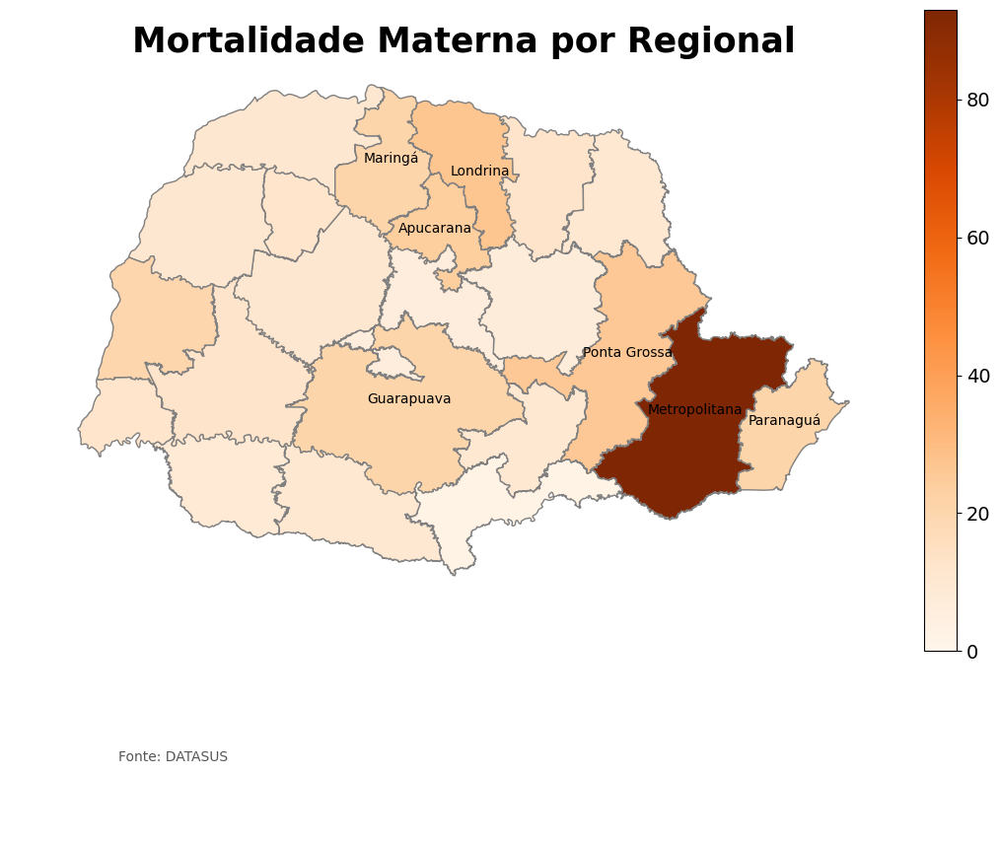

In [ ]:
# desenhar o mapa

color = 'Oranges'
vmin, vmax = 0, df_mapa_rs1["OBITOS_MATERNOS"].max()

fig, ax = plt.subplots(1, figsize=(12, 12))

df_mapa_rs1.plot(
    column='OBITOS_MATERNOS',
    cmap=color,
    linewidth=1,
    ax=ax,
    edgecolor='grey',
    vmin=vmin,
    vmax=vmax,
    legend=False
)

sm = mpl.cm.ScalarMappable(
    cmap=color,
    norm=mpl.colors.Normalize(vmin=vmin, vmax=vmax)
)
sm._A = []

cbar = fig.colorbar(sm, ax=ax, fraction=0.035, pad=0.04)
cbar.ax.tick_params(labelsize=14)

ax.set_axis_off()

ax.set_title(
    'Mortalidade Materna por Regional',
    fontsize=25,
    fontweight='bold'
)

ax.annotate(
    'Fonte: DATASUS',
    xy=(0.1, 0.08),
    xycoords='figure fraction',
    ha='left',
    va='top',
    fontsize=10,
    color='#555555'
)

threshold = df_mapa_rs1["OBITOS_MATERNOS"].nlargest(5).min()

for _, row in df_mapa_rs1.iterrows():
    if row["OBITOS_MATERNOS"] >= threshold:
        ax.annotate(
            text=row['REGIONAL'],
            xy=row['coords'],
            ha='center',
            fontsize=10,
            color='black'
        )

plt.show()

In [ ]:
## início SINASC
DBF_DIR_SINASC = DATA_DIR / "raw" / "SINASC"

In [ ]:
dfs = []
for f in sorted(DBF_DIR_SINASC.glob("DN*.dbf")):
    df = pd.DataFrame(iter(DBF(f, load=True, char_decode_errors="ignore")))
    df.columns = [c.strip().upper() for c in df.columns]
    df["ARQUIVO_ORIGEM"] = f.name
    dfs.append(df)

sinasc = pd.concat(dfs, ignore_index=True)
sinasc.shape

(553476, 62)

In [ ]:
sinasc = normalize_datasus_date_ddmmyyyy(sinasc, "DTNASC")

In [ ]:
mun_col = None
for cand in ["CODMUNRES", "CODMUNRESMAE", "MUNRES", "MUN_RES"]:
    if cand in sinasc.columns:
        mun_col = cand
        break

if mun_col is None:
    raise ValueError("Não achei coluna de município de residência no SINASC (CODMUNRES/CODMUNRESMAE/...).")

sinasc["CODMUNRES_PAD"] = (
    sinasc[mun_col].astype(str)
    .str.extract(r"(\d+)")[0].fillna("")
    .str.zfill(6)
)

In [ ]:
sinasc = sinasc.merge(
    mun2rs[["CODMUN_IBGE6", "REGIONAL_SAUDE", "Municipio"]],
    how="left",
    left_on="CODMUNRES_PAD",
    right_on="CODMUN_IBGE6"
)

sinasc["REGIONAL_SAUDE"] = sinasc["REGIONAL_SAUDE"].astype("Int64")

In [ ]:
missing = sinasc["REGIONAL_SAUDE"].isna().mean()
print(f"% sem REGIONAL_SAUDE (SINASC-PR): {missing:.2%}")

% sem REGIONAL_SAUDE (SINASC-PR): 0.00%


In [ ]:
# filtrar período e agregar por ano e Regional
ANOS = (2021, 2024)

sinasc_filt = sinasc[
    sinasc['DTNASC_ANO'].between(ANOS[0], ANOS[1]) &
    sinasc['REGIONAL_SAUDE'].notna()
].copy()

sinasc_rs = (
    sinasc_filt
    .groupby(['REGIONAL_SAUDE','DTNASC_ANO'])
    .size()
    .reset_index(name='NASCIDOS_VIVOS')
    .sort_values(['REGIONAL_SAUDE','DTNASC_ANO'])
)

sinasc_rs

,REGIONAL_SAUDE,DTNASC_ANO,NASCIDOS_VIVOS
0,1,2021,4012
1,1,2022,3953
2,1,2023,3822
3,1,2024,3566
4,2,2021,41543
...,...,...,...
83,21,2024,2140
84,22,2021,1564
85,22,2022,1612
86,22,2023,1656


In [ ]:
# filtrar período e agregar por Regional
ANOS = (2021, 2024)

sinasc_filt2 = sinasc[
    sinasc['DTNASC_ANO'].between(ANOS[0], ANOS[1]) &
    sinasc['REGIONAL_SAUDE'].notna()
].copy()

sinasc_rs2 = (
    sinasc_filt2
    .groupby(['REGIONAL_SAUDE'])
    .size()
    .reset_index(name='NASCIDOS_VIVOS')
    .sort_values(['REGIONAL_SAUDE'])
)

sinasc_rs2

,REGIONAL_SAUDE,NASCIDOS_VIVOS
0,1,15353
1,2,160719
2,3,33427
3,4,8506
4,5,25593
5,6,8564
6,7,15855
7,8,18924
8,9,24268
9,10,30521


In [ ]:
# filtrar período e agregar por Regional e Município
ANOS = (2021, 2024)

sinasc_filt3 = sinasc[
    sinasc['DTNASC_ANO'].between(ANOS[0], ANOS[1]) &
    sinasc['REGIONAL_SAUDE'].notna()
].copy()

sinasc_rs_mun_incompleto = (
    sinasc_filt3
    .groupby(['REGIONAL_SAUDE', 'Municipio', 'CODMUNRES_PAD'])
    .size()
    .reset_index(name='NASCIDOS_VIVOS')
    .sort_values(['REGIONAL_SAUDE', 'Municipio'])
)

sinasc_rs_mun = mun2rs.copy()

sinasc_rs_mun = sinasc_rs_mun.merge(
    sinasc_rs_mun_incompleto[['CODMUNRES_PAD','REGIONAL_SAUDE', 'Municipio', 'NASCIDOS_VIVOS']],
    how='left',
    left_on='CODMUN_IBGE6',
    right_on='CODMUNRES_PAD'
)

sinasc_rs_mun = sinasc_rs_mun.drop(columns=['CODMUN_IBGE6', 'REGIONAL_SAUDE_x', 'CODMUNRES_PAD', 'REGIONAL_SAUDE_y', 'Municipio_y'])
sinasc_rs_mun.rename(columns={'Municipio_x': 'Municipio'}, inplace=True)
sinasc_rs_mun['NASCIDOS_VIVOS'] = sinasc_rs_mun['NASCIDOS_VIVOS'].fillna(0)
sinasc_rs_mun['NASCIDOS_VIVOS'] = sinasc_rs_mun['NASCIDOS_VIVOS'].astype(int)

# Dataframe a ser exportado como sinasc
sinasc_rs_mun

,Regional de Saude,Municipio,Codigo,NASCIDOS_VIVOS
0,18,Abatiá,410010,293
1,2,Adrianópolis,410020,272
2,2,Agudos do Sul,410030,563
3,2,Almirante Tamandaré,410040,6063
4,11,Altamira do Paraná,410045,190
...,...,...,...,...
394,8,Verê,412860,379
395,5,Virmond,412865,187
396,7,Vitorino,412870,513
397,19,Wenceslau Braz,412850,1032


In [ ]:
df_mapa2 = df_mapa.merge(
    mun2rs[["CODMUN_IBGE6", "REGIONAL_SAUDE"]],
    how="left",
    on="CODMUN_IBGE6"
)
df_mapa2

,gid,codibge,nome,geometry,CODMUN_IBGE6,REGIONAL_SAUDE
0,399,4128807,Xambre,"POLYGON ((-53.53611 -23.81954, -53.5366 -23.81...",412880,12
1,93,4106852,Cruzmaltina,"POLYGON ((-51.38116 -24.05889, -51.38115 -24.0...",410685,22
2,348,4125407,Sao Jose Da Boa Vista,"POLYGON ((-49.53659 -23.92793, -49.53674 -23.9...",412540,19
3,331,4124004,Santana Do Itarare,"POLYGON ((-49.6312 -23.84646, -49.63154 -23.84...",412400,19
4,359,4126207,Sapopema,"POLYGON ((-50.44879 -23.75585, -50.44878 -23.7...",412620,18
...,...,...,...,...,...,...
394,238,4117214,Nova Santa Barbara,"POLYGON ((-50.77044 -23.61442, -50.77055 -23.6...",411721,18
395,296,4121307,Rancho Alegre,"POLYGON ((-50.85481 -23.1117, -50.85514 -23.11...",412130,18
396,364,4126405,Sertaneja,"POLYGON ((-50.84225 -23.11003, -50.84237 -23.1...",412640,18
397,141,4109807,Ibipora,"POLYGON ((-50.94779 -23.10645, -50.94751 -23.1...",410980,17


In [ ]:
df_mapa2["REGIONAL_SAUDE"].isna().sum()

np.int64(0)

In [ ]:
df_mapa_rs2 = (
    df_mapa2
    .dissolve(
        by="REGIONAL_SAUDE",
        as_index=False
    )
)
df_mapa_rs2

,REGIONAL_SAUDE,geometry,gid,codibge,nome,CODMUN_IBGE6
0,1,"POLYGON ((-48.98943 -25.90592, -48.98922 -25.9...",216,4115705,Matinhos,411570
1,2,"POLYGON ((-49.48664 -26.18714, -49.4867 -26.18...",382,4127882,Tunas Do Parana,412788
2,3,"POLYGON ((-50.09458 -25.6357, -50.09523 -25.63...",275,4119905,Ponta Grossa,411990
3,4,"POLYGON ((-50.67702 -25.87633, -50.6768 -25.87...",195,4113908,Mallet,411390
4,5,"POLYGON ((-52.12418 -25.77454, -52.1246 -25.77...",122,4108452,Foz Do Jordao,410845
5,6,"POLYGON ((-51.25503 -26.37317, -51.25389 -26.3...",35,4102901,Bituruna,410290
6,7,"POLYGON ((-52.52202 -26.3978, -52.52292 -26.39...",75,4105409,Chopinzinho,410540
7,8,"POLYGON ((-53.43224 -26.27987, -53.43309 -26.2...",283,4120358,Pranchita,412035
8,9,"POLYGON ((-53.91971 -25.57936, -53.92299 -25.5...",119,4108304,Foz Do Iguacu,410830
9,10,"POLYGON ((-53.48976 -25.53275, -53.49061 -25.5...",327,4123824,Santa Lucia,412382


<Axes: >

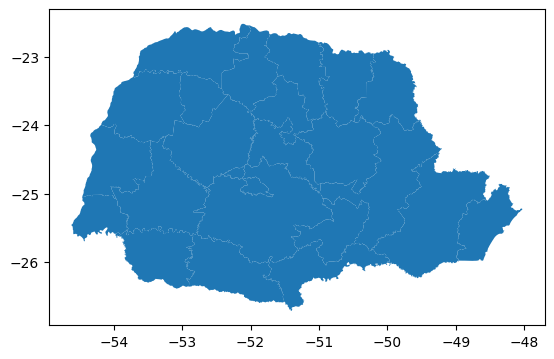

In [ ]:
# exibir o mapa
df_mapa_rs2.plot()

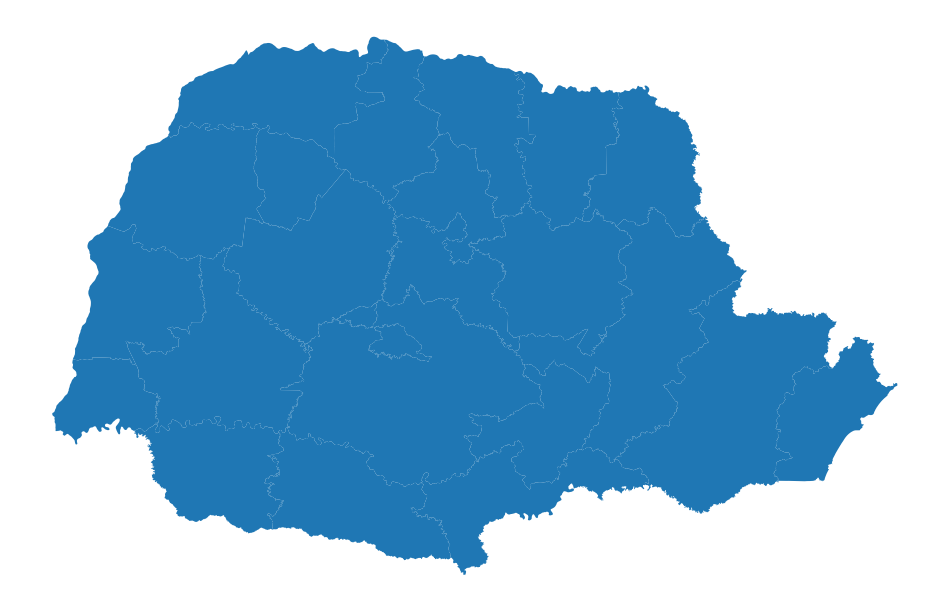

In [ ]:
# expandir o espaço do mapa
fig, ax = plt.subplots(1, figsize=(12,12))

# desenhar o mapa
df_mapa_rs2.plot(ax=ax)

# tirar os eixos
ax.set_axis_off()

plt.show()

In [ ]:
df_mapa_rs2 = df_mapa_rs2.merge(
    rs[["REGIONAL_SAUDE", "REGIONAL"]],
    how="left",
    on="REGIONAL_SAUDE"
)
df_mapa_rs2

,REGIONAL_SAUDE,geometry,gid,codibge,nome,CODMUN_IBGE6,REGIONAL
0,1,"POLYGON ((-48.98943 -25.90592, -48.98922 -25.9...",216,4115705,Matinhos,411570,Paranaguá
1,2,"POLYGON ((-49.48664 -26.18714, -49.4867 -26.18...",382,4127882,Tunas Do Parana,412788,Metropolitana
2,3,"POLYGON ((-50.09458 -25.6357, -50.09523 -25.63...",275,4119905,Ponta Grossa,411990,Ponta Grossa
3,4,"POLYGON ((-50.67702 -25.87633, -50.6768 -25.87...",195,4113908,Mallet,411390,Irati
4,5,"POLYGON ((-52.12418 -25.77454, -52.1246 -25.77...",122,4108452,Foz Do Jordao,410845,Guarapuava
5,6,"POLYGON ((-51.25503 -26.37317, -51.25389 -26.3...",35,4102901,Bituruna,410290,União da Vitória
6,7,"POLYGON ((-52.52202 -26.3978, -52.52292 -26.39...",75,4105409,Chopinzinho,410540,Pato Branco
7,8,"POLYGON ((-53.43224 -26.27987, -53.43309 -26.2...",283,4120358,Pranchita,412035,Francisco Beltrão
8,9,"POLYGON ((-53.91971 -25.57936, -53.92299 -25.5...",119,4108304,Foz Do Iguacu,410830,Foz do Iguaçu
9,10,"POLYGON ((-53.48976 -25.53275, -53.49061 -25.5...",327,4123824,Santa Lucia,412382,Cascavel


In [ ]:
df_mapa_rs2 = df_mapa_rs2.merge(
    sinasc_rs2[["REGIONAL_SAUDE", "NASCIDOS_VIVOS"]],
    how="left",
    on="REGIONAL_SAUDE"
)
df_mapa_rs2

,REGIONAL_SAUDE,geometry,gid,codibge,nome,CODMUN_IBGE6,REGIONAL,NASCIDOS_VIVOS
0,1,"POLYGON ((-48.98943 -25.90592, -48.98922 -25.9...",216,4115705,Matinhos,411570,Paranaguá,15353
1,2,"POLYGON ((-49.48664 -26.18714, -49.4867 -26.18...",382,4127882,Tunas Do Parana,412788,Metropolitana,160719
2,3,"POLYGON ((-50.09458 -25.6357, -50.09523 -25.63...",275,4119905,Ponta Grossa,411990,Ponta Grossa,33427
3,4,"POLYGON ((-50.67702 -25.87633, -50.6768 -25.87...",195,4113908,Mallet,411390,Irati,8506
4,5,"POLYGON ((-52.12418 -25.77454, -52.1246 -25.77...",122,4108452,Foz Do Jordao,410845,Guarapuava,25593
5,6,"POLYGON ((-51.25503 -26.37317, -51.25389 -26.3...",35,4102901,Bituruna,410290,União da Vitória,8564
6,7,"POLYGON ((-52.52202 -26.3978, -52.52292 -26.39...",75,4105409,Chopinzinho,410540,Pato Branco,15855
7,8,"POLYGON ((-53.43224 -26.27987, -53.43309 -26.2...",283,4120358,Pranchita,412035,Francisco Beltrão,18924
8,9,"POLYGON ((-53.91971 -25.57936, -53.92299 -25.5...",119,4108304,Foz Do Iguacu,410830,Foz do Iguaçu,24268
9,10,"POLYGON ((-53.48976 -25.53275, -53.49061 -25.5...",327,4123824,Santa Lucia,412382,Cascavel,30521


In [ ]:
# obter as coordenadas dos polígonos
df_mapa_rs2['coords'] = df_mapa_rs2['geometry'].apply(lambda x: x.representative_point().coords[:])
df_mapa_rs2['coords'] = [coords[0] for coords in df_mapa_rs2['coords']]

df_mapa_rs2

,REGIONAL_SAUDE,geometry,gid,codibge,nome,CODMUN_IBGE6,REGIONAL,NASCIDOS_VIVOS,coords
0,1,"POLYGON ((-48.98943 -25.90592, -48.98922 -25.9...",216,4115705,Matinhos,411570,Paranaguá,15353,"(-48.57896010717457, -25.425048401155856)"
1,2,"POLYGON ((-49.48664 -26.18714, -49.4867 -26.18...",382,4127882,Tunas Do Parana,412788,Metropolitana,160719,"(-49.34231414037282, -25.326991228777086)"
2,3,"POLYGON ((-50.09458 -25.6357, -50.09523 -25.63...",275,4119905,Ponta Grossa,411990,Ponta Grossa,33427,"(-49.917275991378474, -24.84314237507477)"
3,4,"POLYGON ((-50.67702 -25.87633, -50.6768 -25.87...",195,4113908,Mallet,411390,Irati,8506,"(-50.83512860333401, -25.54482684531247)"
4,5,"POLYGON ((-52.12418 -25.77454, -52.1246 -25.77...",122,4108452,Foz Do Jordao,410845,Guarapuava,25593,"(-51.786449221398996, -25.237311295939655)"
5,6,"POLYGON ((-51.25503 -26.37317, -51.25389 -26.3...",35,4102901,Bituruna,410290,União da Vitória,8564,"(-51.21760066305042, -26.19121119438107)"
6,7,"POLYGON ((-52.52202 -26.3978, -52.52292 -26.39...",75,4105409,Chopinzinho,410540,Pato Branco,15855,"(-52.32294981765979, -26.08310140366172)"
7,8,"POLYGON ((-53.43224 -26.27987, -53.43309 -26.2...",283,4120358,Pranchita,412035,Francisco Beltrão,18924,"(-53.36173244885261, -25.934673706823773)"
8,9,"POLYGON ((-53.91971 -25.57936, -53.92299 -25.5...",119,4108304,Foz Do Iguacu,410830,Foz do Iguaçu,24268,"(-54.167826162128364, -25.35683746452434)"
9,10,"POLYGON ((-53.48976 -25.53275, -53.49061 -25.5...",327,4123824,Santa Lucia,412382,Cascavel,30521,"(-53.16386155649289, -24.887229705566053)"


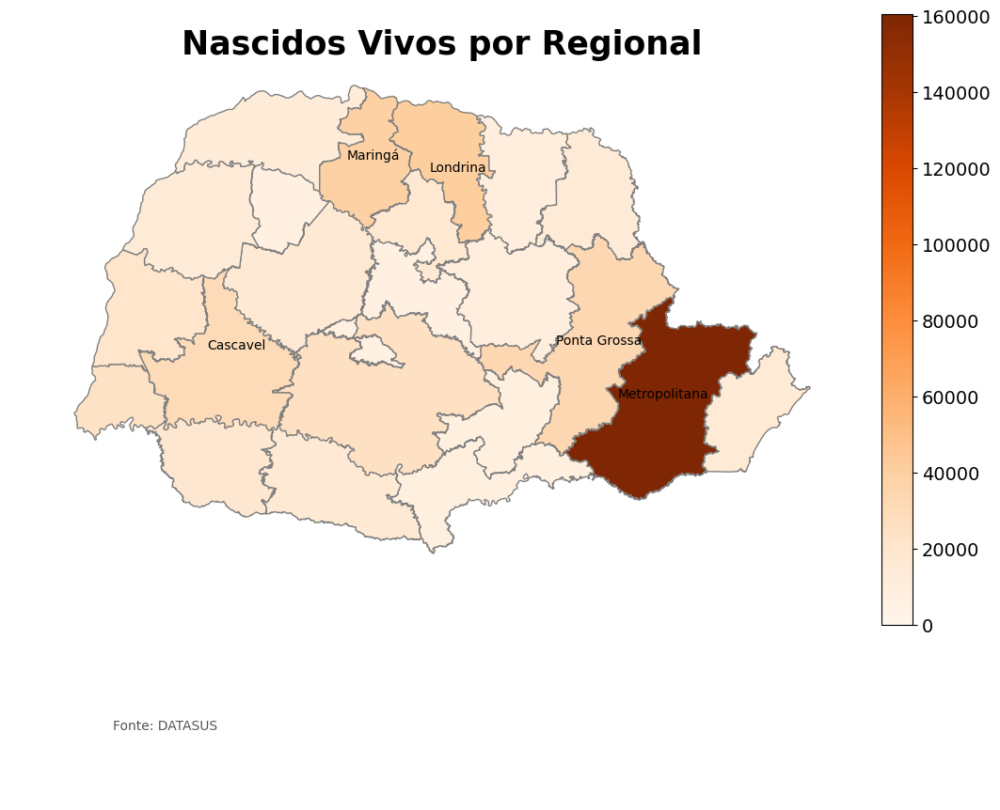

In [ ]:
# desenhar o mapa

color = 'Oranges'
vmin, vmax = 0, df_mapa_rs2["NASCIDOS_VIVOS"].max()

fig, ax = plt.subplots(1, figsize=(12, 12))

df_mapa_rs2.plot(
    column='NASCIDOS_VIVOS',
    cmap=color,
    linewidth=1,
    ax=ax,
    edgecolor='grey',
    vmin=vmin,
    vmax=vmax,
    legend=False
)

sm = mpl.cm.ScalarMappable(
    cmap=color,
    norm=mpl.colors.Normalize(vmin=vmin, vmax=vmax)
)
sm._A = []

cbar = fig.colorbar(sm, ax=ax, fraction=0.035, pad=0.04)
cbar.ax.tick_params(labelsize=14)

ax.set_axis_off()

ax.set_title(
    'Nascidos Vivos por Regional',
    fontsize=25,
    fontweight='bold'
)

ax.annotate(
    'Fonte: DATASUS',
    xy=(0.1, 0.08),
    xycoords='figure fraction',
    ha='left',
    va='top',
    fontsize=10,
    color='#555555'
)

threshold = df_mapa_rs2["NASCIDOS_VIVOS"].nlargest(5).min()

for _, row in df_mapa_rs2.iterrows():
    if row["NASCIDOS_VIVOS"] >= threshold:
        ax.annotate(
            text=row['REGIONAL'],
            xy=row['coords'],
            ha='center',
            fontsize=10,
            color='black'
        )

plt.show()

In [ ]:
df_sim_total = (
    df_mapa_rs1
    .copy()
    .assign(REGIONAL_SAUDE=lambda d: d["REGIONAL_SAUDE"].astype("Int64"))
    .groupby("REGIONAL_SAUDE", as_index=False)["OBITOS_MATERNOS"].sum()
)

df_sim_total

,REGIONAL_SAUDE,OBITOS_MATERNOS
0,1,21
1,2,93
2,3,26
3,4,10
4,5,21
5,6,2
6,7,10
7,8,9
8,9,12
9,10,13


In [ ]:
df_sinasc_total = (
    df_mapa_rs2
    .copy()
    .assign(REGIONAL_SAUDE=lambda d: d["REGIONAL_SAUDE"].astype("Int64"))
    .groupby("REGIONAL_SAUDE", as_index=False)["NASCIDOS_VIVOS"].sum()
)

df_sinasc_total

,REGIONAL_SAUDE,NASCIDOS_VIVOS
0,1,15353
1,2,160719
2,3,33427
3,4,8506
4,5,25593
5,6,8564
6,7,15855
7,8,18924
8,9,24268
9,10,30521


In [ ]:
# cálculo da RMM (Razão de Mortalidade Materna) acumulada no período 2021–2024
rmm_rs = df_sinasc_total.merge(df_sim_total, on="REGIONAL_SAUDE", how="left")

# regionais sem óbito no período → 0
rmm_rs["OBITOS_MATERNOS"] = rmm_rs["OBITOS_MATERNOS"].fillna(0).astype(int)

# evita divisão por zero
rmm_rs["RMM_2021_2024"] = (rmm_rs["OBITOS_MATERNOS"] / rmm_rs["NASCIDOS_VIVOS"]) * 100000
rmm_rs.loc[rmm_rs["NASCIDOS_VIVOS"] == 0, "RMM_2021_2024"] = pd.NA

rmm_rs["RMM_2021_2024"] = rmm_rs["RMM_2021_2024"].round(2)

rmm_rs = rmm_rs.sort_values("RMM_2021_2024", ascending=False)
rmm_rs

,REGIONAL_SAUDE,NASCIDOS_VIVOS,OBITOS_MATERNOS,RMM_2021_2024
12,13,7301,12,164.36
0,1,15353,21,136.78
15,16,17640,24,136.05
17,18,9788,13,132.82
3,4,8506,10,117.56
21,22,6381,6,94.03
19,20,21752,20,91.95
13,14,12880,11,85.40
4,5,25593,21,82.05
2,3,33427,26,77.78


In [ ]:
# Para remover acentos da coluna Municipio, para obter a ordenação correta
def remover_acentos(texto):
    return ''.join(
        c for c in unicodedata.normalize('NFKD', texto)
        if not unicodedata.combining(c)
    )

In [ ]:
# cálculo da RMM (Razão de Mortalidade Materna) acumulada no período 2021–2024 - dados dos municípios
rmm_rs_mun = sim_rs_mun.merge(sinasc_rs_mun, on="Codigo", how="left")

# evita divisão por zero
rmm_rs_mun["RMM_MUN_2021_2024"] = (rmm_rs_mun["OBITOS_MATERNOS"] / rmm_rs_mun["NASCIDOS_VIVOS"]) * 100000
rmm_rs_mun.loc[rmm_rs_mun["NASCIDOS_VIVOS"] == 0, "RMM_MUN_2021_2024"] = pd.NA

rmm_rs_mun["RMM_MUN_2021_2024"] = rmm_rs_mun["RMM_MUN_2021_2024"].round(2)

rmm_rs_mun = rmm_rs_mun.drop(columns=['Regional de Saude_y', 'Municipio_y'])
rmm_rs_mun.rename(columns={'Regional de Saude_x': 'Regional de Saude', 'Municipio_x': 'Municipio'}, inplace=True)

rmm_rs_mun["Municipio_ord"] = (
    rmm_rs_mun["Municipio"]
    .astype(str)
    .apply(remover_acentos)
    .str.upper()
)

rmm_rs_mun = rmm_rs_mun.sort_values(["Municipio_ord", "Regional de Saude"], ascending=True)

rmm_rs_mun = rmm_rs_mun.drop(columns=["Municipio_ord"])

# Dataframe a ser exportado como rmm
rmm_rs_mun

,Regional de Saude,Municipio,Codigo,OBITOS_MATERNOS,NASCIDOS_VIVOS,RMM_MUN_2021_2024
0,18,Abatiá,410010,1,293,341.30
1,2,Adrianópolis,410020,0,272,0.00
2,2,Agudos do Sul,410030,0,563,0.00
3,2,Almirante Tamandaré,410040,4,6063,65.97
4,11,Altamira do Paraná,410045,0,190,0.00
...,...,...,...,...,...,...
394,8,Verê,412860,0,379,0.00
395,5,Virmond,412865,0,187,0.00
396,7,Vitorino,412870,0,513,0.00
397,19,Wenceslau Braz,412850,2,1032,193.80


In [ ]:
with pd.ExcelWriter(OUT_DIR / 'indicator1.xlsx', engine='openpyxl') as writer:
    # Dados do SIM
    sim_rs_mun.to_excel(writer, sheet_name='dados_sim', index=False)
    # Dados do SINASC
    sinasc_rs_mun.to_excel(writer, sheet_name='dados_sinasc', index=False)
    # Dados de RMM
    rmm_rs_mun.to_excel(writer, sheet_name='dados_rmm', index=False)

In [ ]:
df_mapa3 = df_mapa.merge(
    mun2rs[["CODMUN_IBGE6", "REGIONAL_SAUDE"]],
    how="left",
    on="CODMUN_IBGE6"
)
df_mapa3

,gid,codibge,nome,geometry,CODMUN_IBGE6,REGIONAL_SAUDE
0,399,4128807,Xambre,"POLYGON ((-53.53611 -23.81954, -53.5366 -23.81...",412880,12
1,93,4106852,Cruzmaltina,"POLYGON ((-51.38116 -24.05889, -51.38115 -24.0...",410685,22
2,348,4125407,Sao Jose Da Boa Vista,"POLYGON ((-49.53659 -23.92793, -49.53674 -23.9...",412540,19
3,331,4124004,Santana Do Itarare,"POLYGON ((-49.6312 -23.84646, -49.63154 -23.84...",412400,19
4,359,4126207,Sapopema,"POLYGON ((-50.44879 -23.75585, -50.44878 -23.7...",412620,18
...,...,...,...,...,...,...
394,238,4117214,Nova Santa Barbara,"POLYGON ((-50.77044 -23.61442, -50.77055 -23.6...",411721,18
395,296,4121307,Rancho Alegre,"POLYGON ((-50.85481 -23.1117, -50.85514 -23.11...",412130,18
396,364,4126405,Sertaneja,"POLYGON ((-50.84225 -23.11003, -50.84237 -23.1...",412640,18
397,141,4109807,Ibipora,"POLYGON ((-50.94779 -23.10645, -50.94751 -23.1...",410980,17


In [ ]:
df_mapa3["REGIONAL_SAUDE"].isna().sum()

np.int64(0)

In [ ]:
df_mapa_rs3 = (
    df_mapa3
    .dissolve(
        by="REGIONAL_SAUDE",
        as_index=False
    )
)
df_mapa_rs3

,REGIONAL_SAUDE,geometry,gid,codibge,nome,CODMUN_IBGE6
0,1,"POLYGON ((-48.98943 -25.90592, -48.98922 -25.9...",216,4115705,Matinhos,411570
1,2,"POLYGON ((-49.48664 -26.18714, -49.4867 -26.18...",382,4127882,Tunas Do Parana,412788
2,3,"POLYGON ((-50.09458 -25.6357, -50.09523 -25.63...",275,4119905,Ponta Grossa,411990
3,4,"POLYGON ((-50.67702 -25.87633, -50.6768 -25.87...",195,4113908,Mallet,411390
4,5,"POLYGON ((-52.12418 -25.77454, -52.1246 -25.77...",122,4108452,Foz Do Jordao,410845
5,6,"POLYGON ((-51.25503 -26.37317, -51.25389 -26.3...",35,4102901,Bituruna,410290
6,7,"POLYGON ((-52.52202 -26.3978, -52.52292 -26.39...",75,4105409,Chopinzinho,410540
7,8,"POLYGON ((-53.43224 -26.27987, -53.43309 -26.2...",283,4120358,Pranchita,412035
8,9,"POLYGON ((-53.91971 -25.57936, -53.92299 -25.5...",119,4108304,Foz Do Iguacu,410830
9,10,"POLYGON ((-53.48976 -25.53275, -53.49061 -25.5...",327,4123824,Santa Lucia,412382


<Axes: >

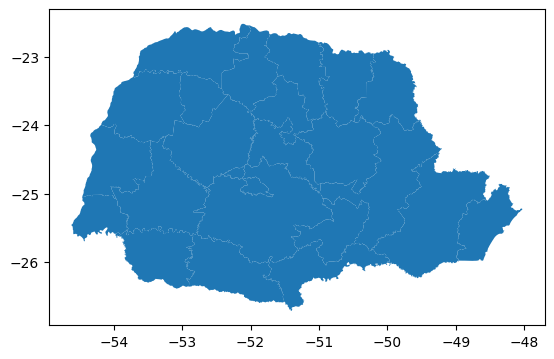

In [ ]:
# exibir o mapa
df_mapa_rs3.plot()

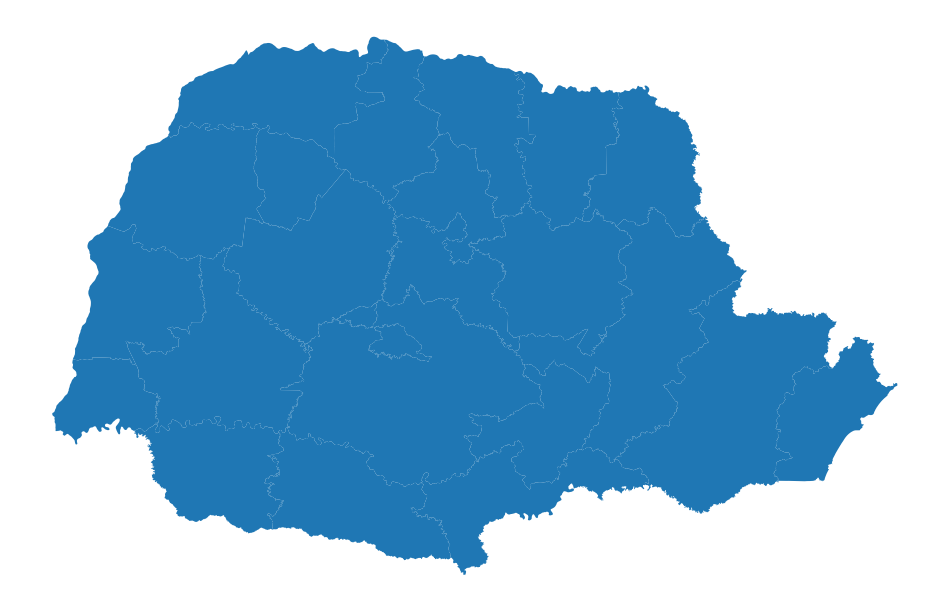

In [ ]:
# expandir o espaço do mapa
fig, ax = plt.subplots(1, figsize=(12,12))

# desenhar o mapa
df_mapa_rs3.plot(ax=ax)

# tirar os eixos
ax.set_axis_off()

plt.show()

In [ ]:
df_mapa_rs3 = df_mapa_rs3.merge(
    rs[["REGIONAL_SAUDE", "REGIONAL"]],
    how="left",
    on="REGIONAL_SAUDE"
)
df_mapa_rs3

,REGIONAL_SAUDE,geometry,gid,codibge,nome,CODMUN_IBGE6,REGIONAL
0,1,"POLYGON ((-48.98943 -25.90592, -48.98922 -25.9...",216,4115705,Matinhos,411570,Paranaguá
1,2,"POLYGON ((-49.48664 -26.18714, -49.4867 -26.18...",382,4127882,Tunas Do Parana,412788,Metropolitana
2,3,"POLYGON ((-50.09458 -25.6357, -50.09523 -25.63...",275,4119905,Ponta Grossa,411990,Ponta Grossa
3,4,"POLYGON ((-50.67702 -25.87633, -50.6768 -25.87...",195,4113908,Mallet,411390,Irati
4,5,"POLYGON ((-52.12418 -25.77454, -52.1246 -25.77...",122,4108452,Foz Do Jordao,410845,Guarapuava
5,6,"POLYGON ((-51.25503 -26.37317, -51.25389 -26.3...",35,4102901,Bituruna,410290,União da Vitória
6,7,"POLYGON ((-52.52202 -26.3978, -52.52292 -26.39...",75,4105409,Chopinzinho,410540,Pato Branco
7,8,"POLYGON ((-53.43224 -26.27987, -53.43309 -26.2...",283,4120358,Pranchita,412035,Francisco Beltrão
8,9,"POLYGON ((-53.91971 -25.57936, -53.92299 -25.5...",119,4108304,Foz Do Iguacu,410830,Foz do Iguaçu
9,10,"POLYGON ((-53.48976 -25.53275, -53.49061 -25.5...",327,4123824,Santa Lucia,412382,Cascavel


In [ ]:
df_mapa_rs3 = df_mapa_rs3.merge(
    rmm_rs[["REGIONAL_SAUDE", "RMM_2021_2024"]],
    how="left",
    on="REGIONAL_SAUDE"
)
df_mapa_rs3

,REGIONAL_SAUDE,geometry,gid,codibge,nome,CODMUN_IBGE6,REGIONAL,RMM_2021_2024
0,1,"POLYGON ((-48.98943 -25.90592, -48.98922 -25.9...",216,4115705,Matinhos,411570,Paranaguá,136.78
1,2,"POLYGON ((-49.48664 -26.18714, -49.4867 -26.18...",382,4127882,Tunas Do Parana,412788,Metropolitana,57.86
2,3,"POLYGON ((-50.09458 -25.6357, -50.09523 -25.63...",275,4119905,Ponta Grossa,411990,Ponta Grossa,77.78
3,4,"POLYGON ((-50.67702 -25.87633, -50.6768 -25.87...",195,4113908,Mallet,411390,Irati,117.56
4,5,"POLYGON ((-52.12418 -25.77454, -52.1246 -25.77...",122,4108452,Foz Do Jordao,410845,Guarapuava,82.05
5,6,"POLYGON ((-51.25503 -26.37317, -51.25389 -26.3...",35,4102901,Bituruna,410290,União da Vitória,23.35
6,7,"POLYGON ((-52.52202 -26.3978, -52.52292 -26.39...",75,4105409,Chopinzinho,410540,Pato Branco,63.07
7,8,"POLYGON ((-53.43224 -26.27987, -53.43309 -26.2...",283,4120358,Pranchita,412035,Francisco Beltrão,47.56
8,9,"POLYGON ((-53.91971 -25.57936, -53.92299 -25.5...",119,4108304,Foz Do Iguacu,410830,Foz do Iguaçu,49.45
9,10,"POLYGON ((-53.48976 -25.53275, -53.49061 -25.5...",327,4123824,Santa Lucia,412382,Cascavel,42.59


In [ ]:
# obter as coordenadas dos polígonos
df_mapa_rs3['coords'] = df_mapa_rs3['geometry'].apply(lambda x: x.representative_point().coords[:])
df_mapa_rs3['coords'] = [coords[0] for coords in df_mapa_rs3['coords']]

df_mapa_rs3

,REGIONAL_SAUDE,geometry,gid,codibge,nome,CODMUN_IBGE6,REGIONAL,RMM_2021_2024,coords
0,1,"POLYGON ((-48.98943 -25.90592, -48.98922 -25.9...",216,4115705,Matinhos,411570,Paranaguá,136.78,"(-48.57896010717457, -25.425048401155856)"
1,2,"POLYGON ((-49.48664 -26.18714, -49.4867 -26.18...",382,4127882,Tunas Do Parana,412788,Metropolitana,57.86,"(-49.34231414037282, -25.326991228777086)"
2,3,"POLYGON ((-50.09458 -25.6357, -50.09523 -25.63...",275,4119905,Ponta Grossa,411990,Ponta Grossa,77.78,"(-49.917275991378474, -24.84314237507477)"
3,4,"POLYGON ((-50.67702 -25.87633, -50.6768 -25.87...",195,4113908,Mallet,411390,Irati,117.56,"(-50.83512860333401, -25.54482684531247)"
4,5,"POLYGON ((-52.12418 -25.77454, -52.1246 -25.77...",122,4108452,Foz Do Jordao,410845,Guarapuava,82.05,"(-51.786449221398996, -25.237311295939655)"
5,6,"POLYGON ((-51.25503 -26.37317, -51.25389 -26.3...",35,4102901,Bituruna,410290,União da Vitória,23.35,"(-51.21760066305042, -26.19121119438107)"
6,7,"POLYGON ((-52.52202 -26.3978, -52.52292 -26.39...",75,4105409,Chopinzinho,410540,Pato Branco,63.07,"(-52.32294981765979, -26.08310140366172)"
7,8,"POLYGON ((-53.43224 -26.27987, -53.43309 -26.2...",283,4120358,Pranchita,412035,Francisco Beltrão,47.56,"(-53.36173244885261, -25.934673706823773)"
8,9,"POLYGON ((-53.91971 -25.57936, -53.92299 -25.5...",119,4108304,Foz Do Iguacu,410830,Foz do Iguaçu,49.45,"(-54.167826162128364, -25.35683746452434)"
9,10,"POLYGON ((-53.48976 -25.53275, -53.49061 -25.5...",327,4123824,Santa Lucia,412382,Cascavel,42.59,"(-53.16386155649289, -24.887229705566053)"


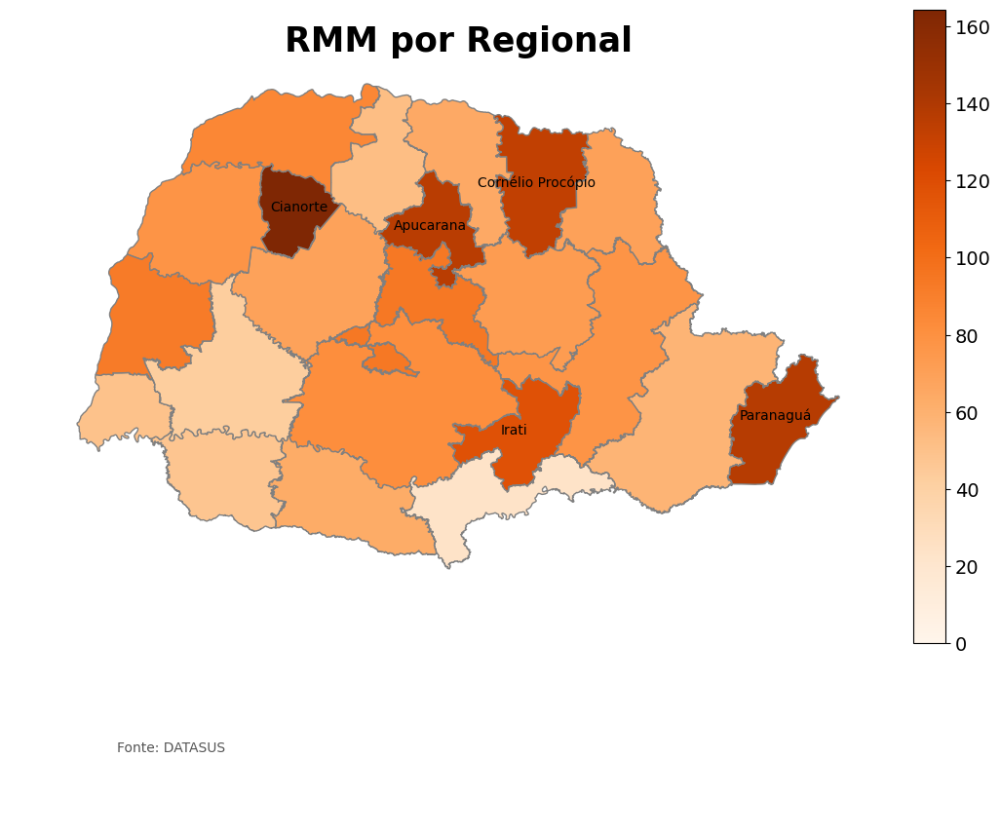

In [ ]:
# desenhar o mapa

color = 'Oranges'
vmin, vmax = 0, df_mapa_rs3["RMM_2021_2024"].max()

fig, ax = plt.subplots(1, figsize=(12, 12))

df_mapa_rs3.plot(
    column='RMM_2021_2024',
    cmap=color,
    linewidth=1,
    ax=ax,
    edgecolor='grey',
    vmin=vmin,
    vmax=vmax,
    legend=False
)

sm = mpl.cm.ScalarMappable(
    cmap=color,
    norm=mpl.colors.Normalize(vmin=vmin, vmax=vmax)
)
sm._A = []

cbar = fig.colorbar(sm, ax=ax, fraction=0.035, pad=0.04)
cbar.ax.tick_params(labelsize=14)

ax.set_axis_off()

ax.set_title(
    'RMM por Regional',
    fontsize=25,
    fontweight='bold'
)

ax.annotate(
    'Fonte: DATASUS',
    xy=(0.1, 0.08),
    xycoords='figure fraction',
    ha='left',
    va='top',
    fontsize=10,
    color='#555555'
)

threshold = df_mapa_rs3["RMM_2021_2024"].nlargest(5).min()

for _, row in df_mapa_rs3.iterrows():
    if row["RMM_2021_2024"] >= threshold:
        ax.annotate(
            text=row['REGIONAL'],
            xy=row['coords'],
            ha='center',
            fontsize=10,
            color='black'
        )

plt.show()
# Resultado: quantos óbitos maternos ocorrem, em média,
#            para cada 100.000 nascidos vivos, no período analisado.

In [ ]:
sim["CAUSABAS"] = sim["CAUSABAS"].astype(str).str.strip().str.upper()

sim["TIPO_CAUSA"] = pd.NA

mask_ind = sim["CAUSABAS"].str.match(r"^O(10|24|25|9[8-9])")

mask_dir_base = sim["CAUSABAS"].str.match(r"^O(0[0-9]|[1-8][0-9]|9[0-5])")
mask_dir = mask_dir_base & ~mask_ind

sim.loc[mask_ind, "TIPO_CAUSA"] = "Indireta"
sim.loc[mask_dir, "TIPO_CAUSA"] = "Direta"

obitos_causa_rs = (
    sim.dropna(subset=["REGIONAL_SAUDE", "TIPO_CAUSA"])
      .groupby(["REGIONAL_SAUDE", "TIPO_CAUSA"])
      .size()
      .unstack(fill_value=0)
      .reset_index()
)

obitos_causa_rs

TIPO_CAUSA,REGIONAL_SAUDE,Direta,Indireta
0,1,11,10
1,2,43,49
2,3,10,16
3,4,3,7
4,5,14,7
5,6,0,2
6,7,3,7
7,8,3,6
8,9,8,4
9,10,7,6


In [ ]:
obitos_diretos = (
    sim[sim["TIPO_CAUSA"] == "Direta"]
    .groupby("REGIONAL_SAUDE")
    .size()
    .reset_index(name="OBITOS_DIRETOS")
)

rmm_direta = (
    df_sinasc_total.merge(obitos_diretos, on="REGIONAL_SAUDE", how="left")
)

rmm_direta["OBITOS_DIRETOS"] = rmm_direta["OBITOS_DIRETOS"].fillna(0).astype(int)

rmm_direta["RMM_DIRETA_2021_2024"] = (
    rmm_direta["OBITOS_DIRETOS"] / rmm_direta["NASCIDOS_VIVOS"]
) * 100000

rmm_direta["RMM_DIRETA_2021_2024"] = rmm_direta["RMM_DIRETA_2021_2024"].round(2)

rmm_direta

,REGIONAL_SAUDE,NASCIDOS_VIVOS,OBITOS_DIRETOS,RMM_DIRETA_2021_2024
0,1,15353,11,71.65
1,2,160719,43,26.75
2,3,33427,10,29.92
3,4,8506,3,35.27
4,5,25593,14,54.70
5,6,8564,0,0.00
6,7,15855,3,18.92
7,8,18924,3,15.85
8,9,24268,8,32.97
9,10,30521,7,22.94


In [ ]:
df_mapa4 = df_mapa.merge(
    mun2rs[["CODMUN_IBGE6", "REGIONAL_SAUDE"]],
    how="left",
    on="CODMUN_IBGE6"
)
df_mapa4

,gid,codibge,nome,geometry,CODMUN_IBGE6,REGIONAL_SAUDE
0,399,4128807,Xambre,"POLYGON ((-53.53611 -23.81954, -53.5366 -23.81...",412880,12
1,93,4106852,Cruzmaltina,"POLYGON ((-51.38116 -24.05889, -51.38115 -24.0...",410685,22
2,348,4125407,Sao Jose Da Boa Vista,"POLYGON ((-49.53659 -23.92793, -49.53674 -23.9...",412540,19
3,331,4124004,Santana Do Itarare,"POLYGON ((-49.6312 -23.84646, -49.63154 -23.84...",412400,19
4,359,4126207,Sapopema,"POLYGON ((-50.44879 -23.75585, -50.44878 -23.7...",412620,18
...,...,...,...,...,...,...
394,238,4117214,Nova Santa Barbara,"POLYGON ((-50.77044 -23.61442, -50.77055 -23.6...",411721,18
395,296,4121307,Rancho Alegre,"POLYGON ((-50.85481 -23.1117, -50.85514 -23.11...",412130,18
396,364,4126405,Sertaneja,"POLYGON ((-50.84225 -23.11003, -50.84237 -23.1...",412640,18
397,141,4109807,Ibipora,"POLYGON ((-50.94779 -23.10645, -50.94751 -23.1...",410980,17


In [ ]:
df_mapa4["REGIONAL_SAUDE"].isna().sum()

np.int64(0)

In [ ]:
df_mapa_rs4 = (
    df_mapa4
    .dissolve(
        by="REGIONAL_SAUDE",
        as_index=False
    )
)
df_mapa_rs4

,REGIONAL_SAUDE,geometry,gid,codibge,nome,CODMUN_IBGE6
0,1,"POLYGON ((-48.98943 -25.90592, -48.98922 -25.9...",216,4115705,Matinhos,411570
1,2,"POLYGON ((-49.48664 -26.18714, -49.4867 -26.18...",382,4127882,Tunas Do Parana,412788
2,3,"POLYGON ((-50.09458 -25.6357, -50.09523 -25.63...",275,4119905,Ponta Grossa,411990
3,4,"POLYGON ((-50.67702 -25.87633, -50.6768 -25.87...",195,4113908,Mallet,411390
4,5,"POLYGON ((-52.12418 -25.77454, -52.1246 -25.77...",122,4108452,Foz Do Jordao,410845
5,6,"POLYGON ((-51.25503 -26.37317, -51.25389 -26.3...",35,4102901,Bituruna,410290
6,7,"POLYGON ((-52.52202 -26.3978, -52.52292 -26.39...",75,4105409,Chopinzinho,410540
7,8,"POLYGON ((-53.43224 -26.27987, -53.43309 -26.2...",283,4120358,Pranchita,412035
8,9,"POLYGON ((-53.91971 -25.57936, -53.92299 -25.5...",119,4108304,Foz Do Iguacu,410830
9,10,"POLYGON ((-53.48976 -25.53275, -53.49061 -25.5...",327,4123824,Santa Lucia,412382


<Axes: >

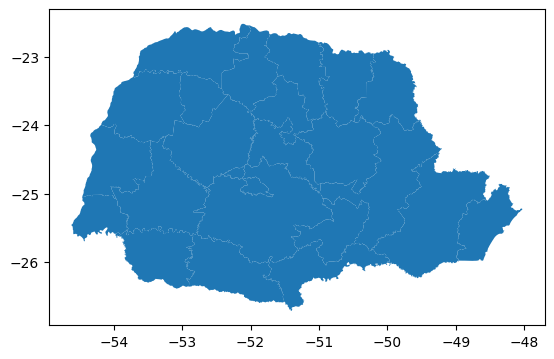

In [ ]:
# exibir o mapa
df_mapa_rs4.plot()

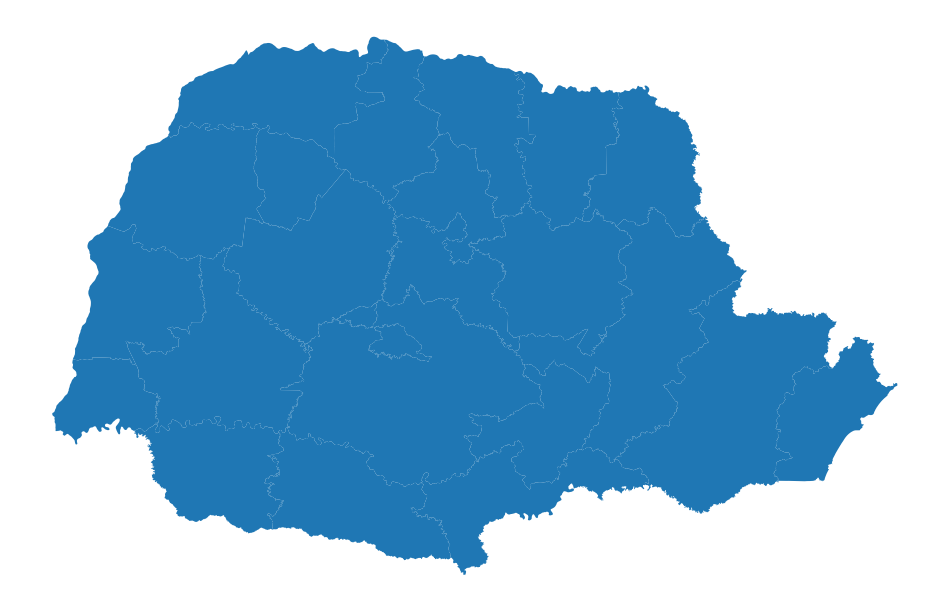

In [ ]:
# expandir o espaço do mapa
fig, ax = plt.subplots(1, figsize=(12,12))

# desenhar o mapa
df_mapa_rs4.plot(ax=ax)

# tirar os eixos
ax.set_axis_off()

plt.show()

In [ ]:
df_mapa_rs4 = df_mapa_rs4.merge(
    rs[["REGIONAL_SAUDE", "REGIONAL"]],
    how="left",
    on="REGIONAL_SAUDE"
)
df_mapa_rs4

,REGIONAL_SAUDE,geometry,gid,codibge,nome,CODMUN_IBGE6,REGIONAL
0,1,"POLYGON ((-48.98943 -25.90592, -48.98922 -25.9...",216,4115705,Matinhos,411570,Paranaguá
1,2,"POLYGON ((-49.48664 -26.18714, -49.4867 -26.18...",382,4127882,Tunas Do Parana,412788,Metropolitana
2,3,"POLYGON ((-50.09458 -25.6357, -50.09523 -25.63...",275,4119905,Ponta Grossa,411990,Ponta Grossa
3,4,"POLYGON ((-50.67702 -25.87633, -50.6768 -25.87...",195,4113908,Mallet,411390,Irati
4,5,"POLYGON ((-52.12418 -25.77454, -52.1246 -25.77...",122,4108452,Foz Do Jordao,410845,Guarapuava
5,6,"POLYGON ((-51.25503 -26.37317, -51.25389 -26.3...",35,4102901,Bituruna,410290,União da Vitória
6,7,"POLYGON ((-52.52202 -26.3978, -52.52292 -26.39...",75,4105409,Chopinzinho,410540,Pato Branco
7,8,"POLYGON ((-53.43224 -26.27987, -53.43309 -26.2...",283,4120358,Pranchita,412035,Francisco Beltrão
8,9,"POLYGON ((-53.91971 -25.57936, -53.92299 -25.5...",119,4108304,Foz Do Iguacu,410830,Foz do Iguaçu
9,10,"POLYGON ((-53.48976 -25.53275, -53.49061 -25.5...",327,4123824,Santa Lucia,412382,Cascavel


In [ ]:
df_mapa_rs4 = df_mapa_rs4.merge(
    rmm_direta[["REGIONAL_SAUDE", "RMM_DIRETA_2021_2024"]],
    how="left",
    on="REGIONAL_SAUDE"
)
df_mapa_rs4

,REGIONAL_SAUDE,geometry,gid,codibge,nome,CODMUN_IBGE6,REGIONAL,RMM_DIRETA_2021_2024
0,1,"POLYGON ((-48.98943 -25.90592, -48.98922 -25.9...",216,4115705,Matinhos,411570,Paranaguá,71.65
1,2,"POLYGON ((-49.48664 -26.18714, -49.4867 -26.18...",382,4127882,Tunas Do Parana,412788,Metropolitana,26.75
2,3,"POLYGON ((-50.09458 -25.6357, -50.09523 -25.63...",275,4119905,Ponta Grossa,411990,Ponta Grossa,29.92
3,4,"POLYGON ((-50.67702 -25.87633, -50.6768 -25.87...",195,4113908,Mallet,411390,Irati,35.27
4,5,"POLYGON ((-52.12418 -25.77454, -52.1246 -25.77...",122,4108452,Foz Do Jordao,410845,Guarapuava,54.70
5,6,"POLYGON ((-51.25503 -26.37317, -51.25389 -26.3...",35,4102901,Bituruna,410290,União da Vitória,0.00
6,7,"POLYGON ((-52.52202 -26.3978, -52.52292 -26.39...",75,4105409,Chopinzinho,410540,Pato Branco,18.92
7,8,"POLYGON ((-53.43224 -26.27987, -53.43309 -26.2...",283,4120358,Pranchita,412035,Francisco Beltrão,15.85
8,9,"POLYGON ((-53.91971 -25.57936, -53.92299 -25.5...",119,4108304,Foz Do Iguacu,410830,Foz do Iguaçu,32.97
9,10,"POLYGON ((-53.48976 -25.53275, -53.49061 -25.5...",327,4123824,Santa Lucia,412382,Cascavel,22.94


In [ ]:
# obter as coordenadas dos polígonos
df_mapa_rs4['coords'] = df_mapa_rs4['geometry'].apply(lambda x: x.representative_point().coords[:])
df_mapa_rs4['coords'] = [coords[0] for coords in df_mapa_rs4['coords']]

df_mapa_rs4

,REGIONAL_SAUDE,geometry,gid,codibge,nome,CODMUN_IBGE6,REGIONAL,RMM_DIRETA_2021_2024,coords
0,1,"POLYGON ((-48.98943 -25.90592, -48.98922 -25.9...",216,4115705,Matinhos,411570,Paranaguá,71.65,"(-48.57896010717457, -25.425048401155856)"
1,2,"POLYGON ((-49.48664 -26.18714, -49.4867 -26.18...",382,4127882,Tunas Do Parana,412788,Metropolitana,26.75,"(-49.34231414037282, -25.326991228777086)"
2,3,"POLYGON ((-50.09458 -25.6357, -50.09523 -25.63...",275,4119905,Ponta Grossa,411990,Ponta Grossa,29.92,"(-49.917275991378474, -24.84314237507477)"
3,4,"POLYGON ((-50.67702 -25.87633, -50.6768 -25.87...",195,4113908,Mallet,411390,Irati,35.27,"(-50.83512860333401, -25.54482684531247)"
4,5,"POLYGON ((-52.12418 -25.77454, -52.1246 -25.77...",122,4108452,Foz Do Jordao,410845,Guarapuava,54.70,"(-51.786449221398996, -25.237311295939655)"
5,6,"POLYGON ((-51.25503 -26.37317, -51.25389 -26.3...",35,4102901,Bituruna,410290,União da Vitória,0.00,"(-51.21760066305042, -26.19121119438107)"
6,7,"POLYGON ((-52.52202 -26.3978, -52.52292 -26.39...",75,4105409,Chopinzinho,410540,Pato Branco,18.92,"(-52.32294981765979, -26.08310140366172)"
7,8,"POLYGON ((-53.43224 -26.27987, -53.43309 -26.2...",283,4120358,Pranchita,412035,Francisco Beltrão,15.85,"(-53.36173244885261, -25.934673706823773)"
8,9,"POLYGON ((-53.91971 -25.57936, -53.92299 -25.5...",119,4108304,Foz Do Iguacu,410830,Foz do Iguaçu,32.97,"(-54.167826162128364, -25.35683746452434)"
9,10,"POLYGON ((-53.48976 -25.53275, -53.49061 -25.5...",327,4123824,Santa Lucia,412382,Cascavel,22.94,"(-53.16386155649289, -24.887229705566053)"


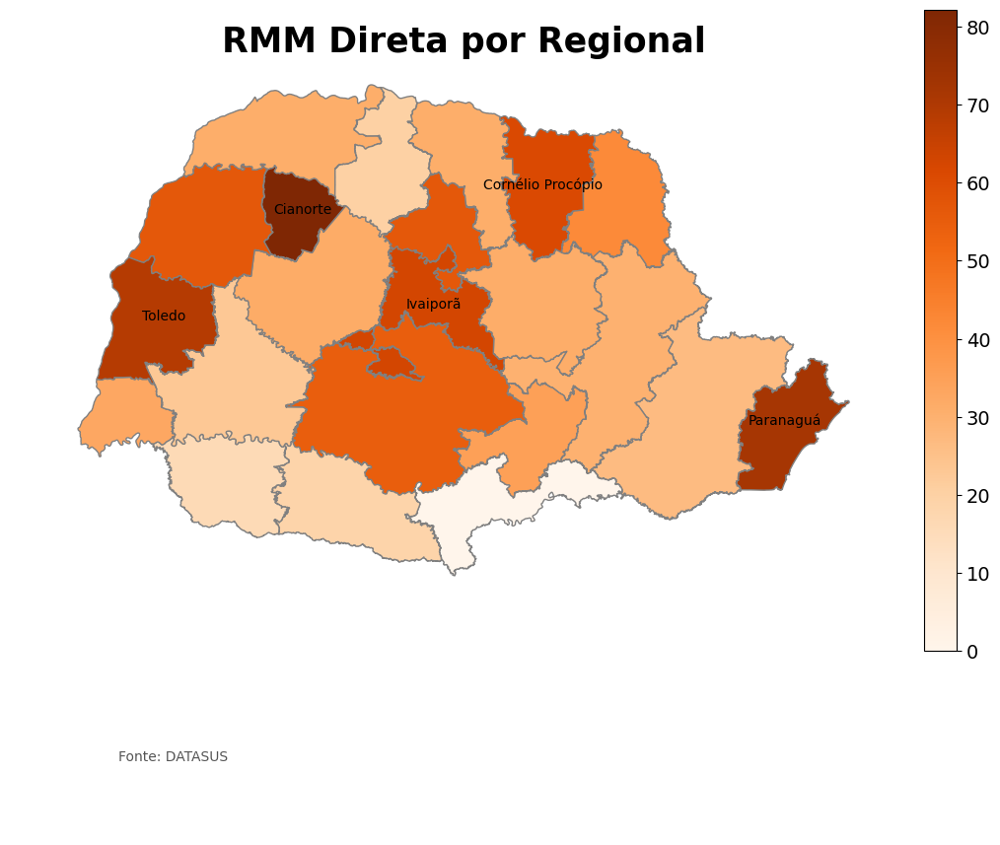

In [ ]:
# desenhar o mapa

color = 'Oranges'
vmin, vmax = 0, df_mapa_rs4["RMM_DIRETA_2021_2024"].max()

fig, ax = plt.subplots(1, figsize=(12, 12))

df_mapa_rs4.plot(
    column='RMM_DIRETA_2021_2024',
    cmap=color,
    linewidth=1,
    ax=ax,
    edgecolor='grey',
    vmin=vmin,
    vmax=vmax,
    legend=False
)

sm = mpl.cm.ScalarMappable(
    cmap=color,
    norm=mpl.colors.Normalize(vmin=vmin, vmax=vmax)
)
sm._A = []

cbar = fig.colorbar(sm, ax=ax, fraction=0.035, pad=0.04)
cbar.ax.tick_params(labelsize=14)

ax.set_axis_off()

ax.set_title(
    'RMM Direta por Regional',
    fontsize=25,
    fontweight='bold'
)

ax.annotate(
    'Fonte: DATASUS',
    xy=(0.1, 0.08),
    xycoords='figure fraction',
    ha='left',
    va='top',
    fontsize=10,
    color='#555555'
)

threshold = df_mapa_rs4["RMM_DIRETA_2021_2024"].nlargest(5).min()

for _, row in df_mapa_rs4.iterrows():
    if row["RMM_DIRETA_2021_2024"] >= threshold:
        ax.annotate(
            text=row['REGIONAL'],
            xy=row['coords'],
            ha='center',
            fontsize=10,
            color='black'
        )

plt.show()
# Resultado: quantos óbitos maternos por causas diretas ocorrem, em média,
#            para cada 100.000 nascidos vivos, no período analisado.

In [ ]:
def populacao_feminina_15_49_media_anual_por_municipio(pop_ano):
    df = pop_ano.copy()

    df["CODMUN_IBGE6"] = (
        df["COD_MUN"].astype(str)
        .str.extract(r"(\d+)")[0]
        .str.slice(0, 6)
        .str.zfill(6)
    )

    # garante tipos
    df["IDADE"] = pd.to_numeric(df["IDADE"], errors="coerce")
    df["SEXO"] = df["SEXO"].astype(str).str.strip()

    # filtra mulheres 15–49 anos
    df = df[
        (df["SEXO"] == "2") &
        (df["IDADE"].between(15, 49))
    ].copy()

    df["POP"] = pd.to_numeric(df["POP"], errors="coerce").fillna(0)

    pop_mun = (
        df.groupby("CODMUN_IBGE6", as_index=False)["POP"]
          .sum()
          .rename(columns={"POP": "POP_FEM_15_49"})
    )

    return pop_mun

In [ ]:
def ler_dbf(caminho):
    return pd.DataFrame(iter(DBF(caminho, load=True, char_decode_errors="ignore")))

In [ ]:
pop21 = ler_dbf(DIR_IBGE / "POP21.dbf")
pop22 = ler_dbf(DIR_IBGE / "POP22.dbf")
pop23 = ler_dbf(DIR_IBGE / "POP23.dbf")
pop24 = ler_dbf(DIR_IBGE / "POP24.dbf")

pop_fem21 = populacao_feminina_15_49_media_anual_por_municipio(pop21)
pop_fem22 = populacao_feminina_15_49_media_anual_por_municipio(pop22)
pop_fem23 = populacao_feminina_15_49_media_anual_por_municipio(pop23)
pop_fem24 = populacao_feminina_15_49_media_anual_por_municipio(pop24)

In [ ]:
pop_fem_2021_2024 = pd.concat(
    [pop_fem21, pop_fem22, pop_fem23, pop_fem24],
    ignore_index=True
)
pop_fem_2021_2024

,CODMUN_IBGE6,POP_FEM_15_49
0,110001,6209
1,110002,30146
2,110003,1400
3,110004,26728
4,110005,4551
...,...,...
22275,522200,3948
22276,522205,2378
22277,522220,1082
22278,522230,1391


In [ ]:
pop_fem_media_periodo_mun = (
    pop_fem_2021_2024
    .groupby("CODMUN_IBGE6", as_index=False)["POP_FEM_15_49"]
    .mean()
    .rename(columns={"POP_FEM_15_49": "POP_FEM_15_49_MEDIA_2021_2024"})
)
pop_fem_media_periodo_mun

,CODMUN_IBGE6,POP_FEM_15_49_MEDIA_2021_2024
0,110001,6034.75
1,110002,30168.75
2,110003,1357.75
3,110004,26828.50
4,110005,4446.75
...,...,...
5565,522200,3944.50
5566,522205,2358.25
5567,522220,1098.00
5568,522230,1400.00


In [ ]:
pop_fem_media_rs = (
    pop_fem_media_periodo_mun
    .merge(
        mun2rs[["CODMUN_IBGE6", "Regional de Saude"]],
        on="CODMUN_IBGE6",
        how="inner"   # garante somente os municípios do PR
    )
    .groupby("Regional de Saude", as_index=False)["POP_FEM_15_49_MEDIA_2021_2024"]
    .sum()
)
pop_fem_media_rs

,Regional de Saude,POP_FEM_15_49_MEDIA_2021_2024
0,1,76555.50
1,2,994074.25
2,3,171652.50
3,4,42142.25
4,5,116783.75
5,6,41382.25
6,7,73475.25
7,8,97323.00
8,9,121648.25
9,10,153541.75


In [ ]:
def internacoes_obstetricas_media_anual_por_municipio(rd_ano: pd.DataFrame) -> pd.DataFrame:
    df = rd_ano.copy()

    df["CODMUN_IBGE6"] = (
        df["MUNIC_RES"].astype(str)
        .str.extract(r"(\d+)")[0]
        .str.slice(0, 6)
        .str.zfill(6)
    )

    df["ANO_CMPT"] = pd.to_numeric(df["ANO_CMPT"], errors="coerce")
    df["MES_CMPT"] = pd.to_numeric(df["MES_CMPT"], errors="coerce")

    df["DIAG_PRINC"] = df["DIAG_PRINC"].astype(str).str.strip().str.upper()

    # internações obstétricas: CID O00–O99
    df = df[df["DIAG_PRINC"].str.match(r"^O\d{2}")].copy()

    df["COMPETEN"] = (
        df["ANO_CMPT"].astype("Int64").astype(str) +
        df["MES_CMPT"].astype("Int64").astype(str).str.zfill(2)
    )

    mensal = (
        df.groupby(["CODMUN_IBGE6", "COMPETEN"])
          .size()
          .reset_index(name="INT_OBS_MES")
    )

    anual = (
        mensal.groupby("CODMUN_IBGE6", as_index=False)["INT_OBS_MES"]
              .sum()
              .rename(columns={"INT_OBS_MES": "INT_OBS_ANUAL"})
    )

    return anual

In [ ]:
rd21 = pd.read_csv(CSV_DIR_SIH / "RDPR21.csv")
rd22 = pd.read_csv(CSV_DIR_SIH / "RDPR22.csv")
rd23 = pd.read_csv(CSV_DIR_SIH / "RDPR23.csv")
rd24 = pd.read_csv(CSV_DIR_SIH / "RDPR24.csv")

internacoes21 = internacoes_obstetricas_media_anual_por_municipio(rd21)
internacoes22 = internacoes_obstetricas_media_anual_por_municipio(rd22)
internacoes23 = internacoes_obstetricas_media_anual_por_municipio(rd23)
internacoes24 = internacoes_obstetricas_media_anual_por_municipio(rd24)

/tmp/ipython-input-542074961.py:1: DtypeWarning: Columns (87,88,96,97,98,99,100,101) have mixed types. Specify dtype option on import or set low_memory=False.
  rd21 = pd.read_csv(CSV_DIR_SIH / "RDPR21.csv")
/tmp/ipython-input-542074961.py:2: DtypeWarning: Columns (87,88,96,97,98,99,100,101) have mixed types. Specify dtype option on import or set low_memory=False.
  rd22 = pd.read_csv(CSV_DIR_SIH / "RDPR22.csv")
/tmp/ipython-input-542074961.py:3: DtypeWarning: Columns (87,88,96,97,98,99,100,101) have mixed types. Specify dtype option on import or set low_memory=False.
  rd23 = pd.read_csv(CSV_DIR_SIH / "RDPR23.csv")
/tmp/ipython-input-542074961.py:4: DtypeWarning: Columns (84,88,96,97,98,99,100,101,102,103) have mixed types. Specify dtype option on import or set low_memory=False.
  rd24 = pd.read_csv(CSV_DIR_SIH / "RDPR24.csv")


In [ ]:
internacoes_2021_2024 = pd.concat(
    [internacoes21, internacoes22, internacoes23, internacoes24],
    ignore_index=True
)

internacoes_media_periodo_mun = (
    internacoes_2021_2024
    .groupby("CODMUN_IBGE6", as_index=False)["INT_OBS_ANUAL"]
    .mean()
    .rename(columns={"INT_OBS_ANUAL": "INT_OBS_MEDIA_2021_2024"})
)

In [ ]:
internacoes_media_periodo_rs = (
    internacoes_media_periodo_mun
    .merge(mun2rs[["CODMUN_IBGE6", "Regional de Saude"]], on="CODMUN_IBGE6", how="left")
    .groupby("Regional de Saude", as_index=False)["INT_OBS_MEDIA_2021_2024"]
    .sum()
    .rename(columns={"INT_OBS_MEDIA_2021_2024": "INT_OBS_MEDIA_2021_2024_RS"})
)

In [ ]:
taxa_internacoes_obstetricas = (
    internacoes_media_periodo_rs
    .merge(pop_fem_media_rs, on="Regional de Saude", how="left")
)

taxa_internacoes_obstetricas["TAXA_INT_OBS_10MIL"] = (
    taxa_internacoes_obstetricas["INT_OBS_MEDIA_2021_2024_RS"] /
    taxa_internacoes_obstetricas["POP_FEM_15_49_MEDIA_2021_2024"]
) * 10000

taxa_internacoes_obstetricas['REGIONAL_SAUDE'] = taxa_internacoes_obstetricas['Regional de Saude'].astype(int)
taxa_internacoes_obstetricas = taxa_internacoes_obstetricas.drop('Regional de Saude', axis=1)
taxa_internacoes_obstetricas['POP_FEM_15_49_MEDIA_2021_2024'] = taxa_internacoes_obstetricas['POP_FEM_15_49_MEDIA_2021_2024'].round(2)
taxa_internacoes_obstetricas["INT_OBS_MEDIA_2021_2024_RS"] = taxa_internacoes_obstetricas["INT_OBS_MEDIA_2021_2024_RS"].round(2)
taxa_internacoes_obstetricas["TAXA_INT_OBS_10MIL"] = taxa_internacoes_obstetricas["TAXA_INT_OBS_10MIL"].round(2)

taxa_internacoes_obstetricas

,INT_OBS_MEDIA_2021_2024_RS,POP_FEM_15_49_MEDIA_2021_2024,TAXA_INT_OBS_10MIL,REGIONAL_SAUDE
0,3240.00,76555.50,423.22,1
1,34597.75,994074.25,348.04,2
2,7176.75,171652.50,418.10,3
3,1729.50,42142.25,410.40,4
4,5995.00,116783.75,513.34,5
5,2204.75,41382.25,532.78,6
6,3439.25,73475.25,468.08,7
7,4544.50,97323.00,466.95,8
8,4911.25,121648.25,403.73,9
9,6047.50,153541.75,393.87,10


In [ ]:
df_mapa5 = df_mapa.merge(
    mun2rs[["CODMUN_IBGE6", "REGIONAL_SAUDE"]],
    how="left",
    on="CODMUN_IBGE6"
)
df_mapa5

,gid,codibge,nome,geometry,CODMUN_IBGE6,REGIONAL_SAUDE
0,399,4128807,Xambre,"POLYGON ((-53.53611 -23.81954, -53.5366 -23.81...",412880,12
1,93,4106852,Cruzmaltina,"POLYGON ((-51.38116 -24.05889, -51.38115 -24.0...",410685,22
2,348,4125407,Sao Jose Da Boa Vista,"POLYGON ((-49.53659 -23.92793, -49.53674 -23.9...",412540,19
3,331,4124004,Santana Do Itarare,"POLYGON ((-49.6312 -23.84646, -49.63154 -23.84...",412400,19
4,359,4126207,Sapopema,"POLYGON ((-50.44879 -23.75585, -50.44878 -23.7...",412620,18
...,...,...,...,...,...,...
394,238,4117214,Nova Santa Barbara,"POLYGON ((-50.77044 -23.61442, -50.77055 -23.6...",411721,18
395,296,4121307,Rancho Alegre,"POLYGON ((-50.85481 -23.1117, -50.85514 -23.11...",412130,18
396,364,4126405,Sertaneja,"POLYGON ((-50.84225 -23.11003, -50.84237 -23.1...",412640,18
397,141,4109807,Ibipora,"POLYGON ((-50.94779 -23.10645, -50.94751 -23.1...",410980,17


In [ ]:
df_mapa_rs5 = (
    df_mapa5
    .dissolve(
        by="REGIONAL_SAUDE",
        as_index=False
    )
)
df_mapa_rs5

,REGIONAL_SAUDE,geometry,gid,codibge,nome,CODMUN_IBGE6
0,1,"POLYGON ((-48.98943 -25.90592, -48.98922 -25.9...",216,4115705,Matinhos,411570
1,2,"POLYGON ((-49.48664 -26.18714, -49.4867 -26.18...",382,4127882,Tunas Do Parana,412788
2,3,"POLYGON ((-50.09458 -25.6357, -50.09523 -25.63...",275,4119905,Ponta Grossa,411990
3,4,"POLYGON ((-50.67702 -25.87633, -50.6768 -25.87...",195,4113908,Mallet,411390
4,5,"POLYGON ((-52.12418 -25.77454, -52.1246 -25.77...",122,4108452,Foz Do Jordao,410845
5,6,"POLYGON ((-51.25503 -26.37317, -51.25389 -26.3...",35,4102901,Bituruna,410290
6,7,"POLYGON ((-52.52202 -26.3978, -52.52292 -26.39...",75,4105409,Chopinzinho,410540
7,8,"POLYGON ((-53.43224 -26.27987, -53.43309 -26.2...",283,4120358,Pranchita,412035
8,9,"POLYGON ((-53.91971 -25.57936, -53.92299 -25.5...",119,4108304,Foz Do Iguacu,410830
9,10,"POLYGON ((-53.48976 -25.53275, -53.49061 -25.5...",327,4123824,Santa Lucia,412382


<Axes: >

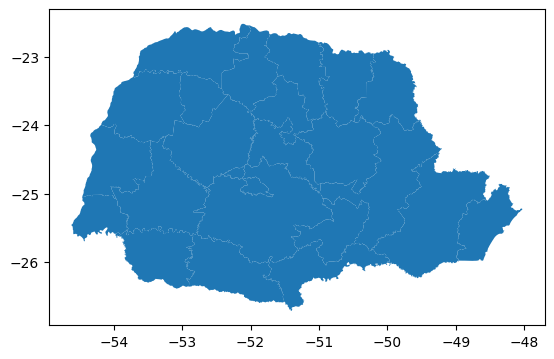

In [ ]:
# exibir o mapa
df_mapa_rs5.plot()

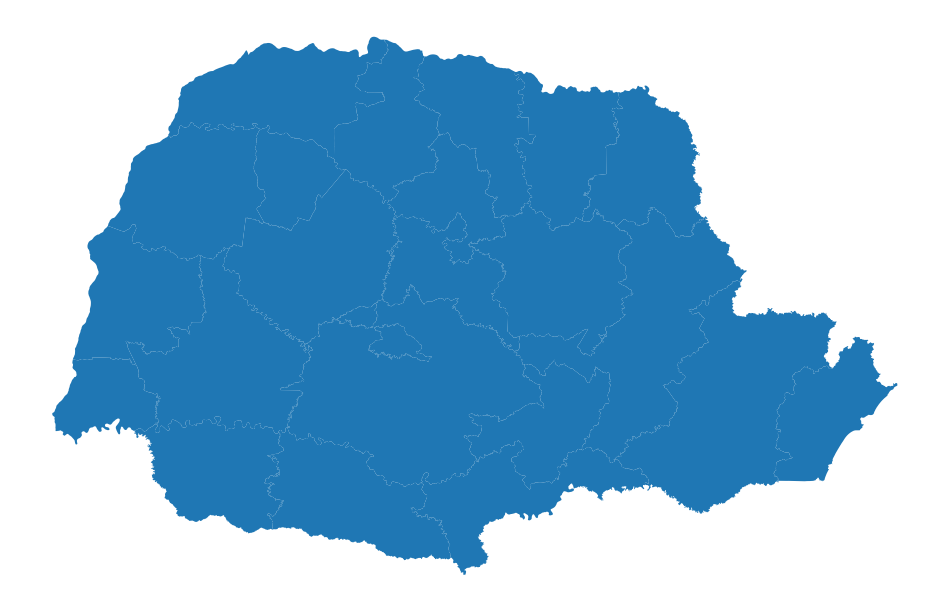

In [ ]:
# expandir o espaço do mapa
fig, ax = plt.subplots(1, figsize=(12,12))

# desenhar o mapa
df_mapa_rs5.plot(ax=ax)

# tirar os eixos
ax.set_axis_off()

plt.show()

In [ ]:
df_mapa_rs5 = df_mapa_rs5.merge(
    rs[["REGIONAL_SAUDE", "REGIONAL"]],
    how="left",
    on="REGIONAL_SAUDE"
)
df_mapa_rs5

,REGIONAL_SAUDE,geometry,gid,codibge,nome,CODMUN_IBGE6,REGIONAL
0,1,"POLYGON ((-48.98943 -25.90592, -48.98922 -25.9...",216,4115705,Matinhos,411570,Paranaguá
1,2,"POLYGON ((-49.48664 -26.18714, -49.4867 -26.18...",382,4127882,Tunas Do Parana,412788,Metropolitana
2,3,"POLYGON ((-50.09458 -25.6357, -50.09523 -25.63...",275,4119905,Ponta Grossa,411990,Ponta Grossa
3,4,"POLYGON ((-50.67702 -25.87633, -50.6768 -25.87...",195,4113908,Mallet,411390,Irati
4,5,"POLYGON ((-52.12418 -25.77454, -52.1246 -25.77...",122,4108452,Foz Do Jordao,410845,Guarapuava
5,6,"POLYGON ((-51.25503 -26.37317, -51.25389 -26.3...",35,4102901,Bituruna,410290,União da Vitória
6,7,"POLYGON ((-52.52202 -26.3978, -52.52292 -26.39...",75,4105409,Chopinzinho,410540,Pato Branco
7,8,"POLYGON ((-53.43224 -26.27987, -53.43309 -26.2...",283,4120358,Pranchita,412035,Francisco Beltrão
8,9,"POLYGON ((-53.91971 -25.57936, -53.92299 -25.5...",119,4108304,Foz Do Iguacu,410830,Foz do Iguaçu
9,10,"POLYGON ((-53.48976 -25.53275, -53.49061 -25.5...",327,4123824,Santa Lucia,412382,Cascavel


In [ ]:
df_mapa_rs5 = df_mapa_rs5.merge(
    taxa_internacoes_obstetricas[["REGIONAL_SAUDE", "TAXA_INT_OBS_10MIL"]],
    how="left",
    on="REGIONAL_SAUDE"
)
df_mapa_rs5

,REGIONAL_SAUDE,geometry,gid,codibge,nome,CODMUN_IBGE6,REGIONAL,TAXA_INT_OBS_10MIL
0,1,"POLYGON ((-48.98943 -25.90592, -48.98922 -25.9...",216,4115705,Matinhos,411570,Paranaguá,423.22
1,2,"POLYGON ((-49.48664 -26.18714, -49.4867 -26.18...",382,4127882,Tunas Do Parana,412788,Metropolitana,348.04
2,3,"POLYGON ((-50.09458 -25.6357, -50.09523 -25.63...",275,4119905,Ponta Grossa,411990,Ponta Grossa,418.10
3,4,"POLYGON ((-50.67702 -25.87633, -50.6768 -25.87...",195,4113908,Mallet,411390,Irati,410.40
4,5,"POLYGON ((-52.12418 -25.77454, -52.1246 -25.77...",122,4108452,Foz Do Jordao,410845,Guarapuava,513.34
5,6,"POLYGON ((-51.25503 -26.37317, -51.25389 -26.3...",35,4102901,Bituruna,410290,União da Vitória,532.78
6,7,"POLYGON ((-52.52202 -26.3978, -52.52292 -26.39...",75,4105409,Chopinzinho,410540,Pato Branco,468.08
7,8,"POLYGON ((-53.43224 -26.27987, -53.43309 -26.2...",283,4120358,Pranchita,412035,Francisco Beltrão,466.95
8,9,"POLYGON ((-53.91971 -25.57936, -53.92299 -25.5...",119,4108304,Foz Do Iguacu,410830,Foz do Iguaçu,403.73
9,10,"POLYGON ((-53.48976 -25.53275, -53.49061 -25.5...",327,4123824,Santa Lucia,412382,Cascavel,393.87


In [ ]:
# obter as coordenadas dos polígonos
df_mapa_rs5['coords'] = df_mapa_rs5['geometry'].apply(lambda x: x.representative_point().coords[:])
df_mapa_rs5['coords'] = [coords[0] for coords in df_mapa_rs5['coords']]

df_mapa_rs5

,REGIONAL_SAUDE,geometry,gid,codibge,nome,CODMUN_IBGE6,REGIONAL,TAXA_INT_OBS_10MIL,coords
0,1,"POLYGON ((-48.98943 -25.90592, -48.98922 -25.9...",216,4115705,Matinhos,411570,Paranaguá,423.22,"(-48.57896010717457, -25.425048401155856)"
1,2,"POLYGON ((-49.48664 -26.18714, -49.4867 -26.18...",382,4127882,Tunas Do Parana,412788,Metropolitana,348.04,"(-49.34231414037282, -25.326991228777086)"
2,3,"POLYGON ((-50.09458 -25.6357, -50.09523 -25.63...",275,4119905,Ponta Grossa,411990,Ponta Grossa,418.10,"(-49.917275991378474, -24.84314237507477)"
3,4,"POLYGON ((-50.67702 -25.87633, -50.6768 -25.87...",195,4113908,Mallet,411390,Irati,410.40,"(-50.83512860333401, -25.54482684531247)"
4,5,"POLYGON ((-52.12418 -25.77454, -52.1246 -25.77...",122,4108452,Foz Do Jordao,410845,Guarapuava,513.34,"(-51.786449221398996, -25.237311295939655)"
5,6,"POLYGON ((-51.25503 -26.37317, -51.25389 -26.3...",35,4102901,Bituruna,410290,União da Vitória,532.78,"(-51.21760066305042, -26.19121119438107)"
6,7,"POLYGON ((-52.52202 -26.3978, -52.52292 -26.39...",75,4105409,Chopinzinho,410540,Pato Branco,468.08,"(-52.32294981765979, -26.08310140366172)"
7,8,"POLYGON ((-53.43224 -26.27987, -53.43309 -26.2...",283,4120358,Pranchita,412035,Francisco Beltrão,466.95,"(-53.36173244885261, -25.934673706823773)"
8,9,"POLYGON ((-53.91971 -25.57936, -53.92299 -25.5...",119,4108304,Foz Do Iguacu,410830,Foz do Iguaçu,403.73,"(-54.167826162128364, -25.35683746452434)"
9,10,"POLYGON ((-53.48976 -25.53275, -53.49061 -25.5...",327,4123824,Santa Lucia,412382,Cascavel,393.87,"(-53.16386155649289, -24.887229705566053)"


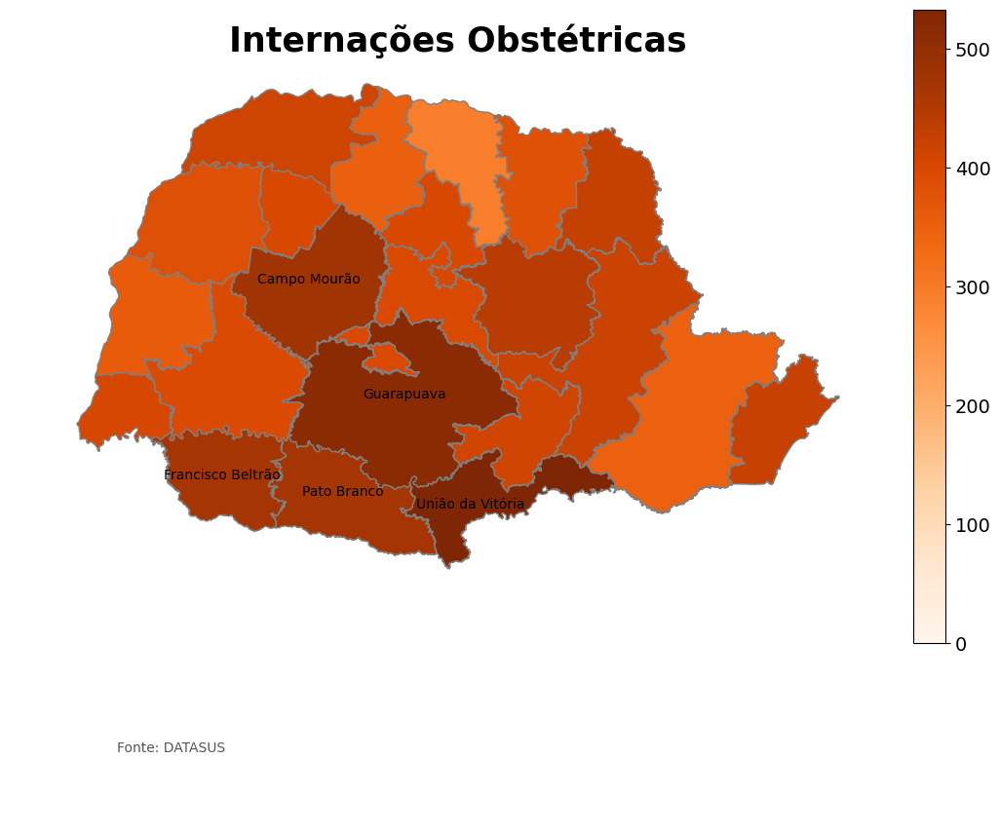

In [ ]:
# desenhar o mapa

color = 'Oranges'
vmin, vmax = 0, df_mapa_rs5["TAXA_INT_OBS_10MIL"].max()

fig, ax = plt.subplots(1, figsize=(12, 12))

df_mapa_rs5.plot(
    column='TAXA_INT_OBS_10MIL',
    cmap=color,
    linewidth=1,
    ax=ax,
    edgecolor='grey',
    vmin=vmin,
    vmax=vmax,
    legend=False
)

sm = mpl.cm.ScalarMappable(
    cmap=color,
    norm=mpl.colors.Normalize(vmin=vmin, vmax=vmax)
)
sm._A = []

cbar = fig.colorbar(sm, ax=ax, fraction=0.035, pad=0.04)
cbar.ax.tick_params(labelsize=14)

ax.set_axis_off()

ax.set_title(
    'Internações Obstétricas',
    fontsize=25,
    fontweight='bold'
)

ax.annotate(
    'Fonte: DATASUS',
    xy=(0.1, 0.08),
    xycoords='figure fraction',
    ha='left',
    va='top',
    fontsize=10,
    color='#555555'
)

threshold = df_mapa_rs5["TAXA_INT_OBS_10MIL"].nlargest(5).min()

for _, row in df_mapa_rs5.iterrows():
    if row["TAXA_INT_OBS_10MIL"] >= threshold:
        ax.annotate(
            text=row['REGIONAL'],
            xy=row['coords'],
            ha='center',
            fontsize=10,
            color='black'
        )

plt.show()
# Resultado: quantas internações obstétricas ocorrem por ano, em média,
#            para cada 10.000 mulheres de 15 a 49 anos.

In [ ]:
# verificar indicadores:
# - Razão de Mortalidade Materna (RMM)
# - Mortalidade por causa (direta/indireta)
# - Taxa de internações obstétricas
# - Cobertura de ESF (Estratégia Saúde da Família)
# - Leitos obstétricos por 10 mil habitantes
# - Profissionais por 10 mil habitantes
# outros passos:
# - propor Sala de Situação (frontend)
# - propor possiblidade de inclusão de outros indicadores (autorreferidos)